# Problem Statement

The primary objective of this project is to analyze and forecast wine sales trends for the 20th century based on historical data provided by ABC Estate Wines. We aim to equip ABC Estate Wines with the necessary insights and foresight to enhance sales performance, capitalize on emerging market opportunities, and maintain a competitive edge in the wine industry.

### Import Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn import metrics
import warnings
warnings.filterwarnings("ignore")

In [2]:
import os
os.getcwd()
os.chdir("C:/Users/AKHIL MOHANDAS/Documents/Study_Material/FORECASTING")

###### Read the Data

In [3]:
df = pd.read_csv('Sparkling.csv')

###### Data Types

In [4]:
df.dtypes

YearMonth    object
Sparkling     int64
dtype: object

*YearMonth column is not seen as a date object*

In [5]:
df= pd.read_csv('Sparkling.csv', parse_dates = ['YearMonth'],index_col = 'YearMonth')

In [6]:
df.dtypes

Sparkling    int64
dtype: object

*Now the time series reference is approprately identified.*

###### Top 5 Rows

In [7]:
df.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


###### Bottom 5 Rows

In [8]:
df.tail()

,Sparkling
YearMonth,
1995-03-01,1897
1995-04-01,1862
1995-05-01,1670
1995-06-01,1688
1995-07-01,2031


### Shape of the data

In [9]:
df.shape

(187, 1)

### Basic Info

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-01 to 1995-07-01
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Sparkling  187 non-null    int64
dtypes: int64(1)
memory usage: 2.9 KB


#### Description of data

In [11]:
round(df.describe(),3)

,Sparkling
count,187.000
mean,2402.417
std,1295.112
min,1070.000
25%,1605.000
50%,1874.000
75%,2549.000
max,7242.000


### EDA

#### Plot the Time Series

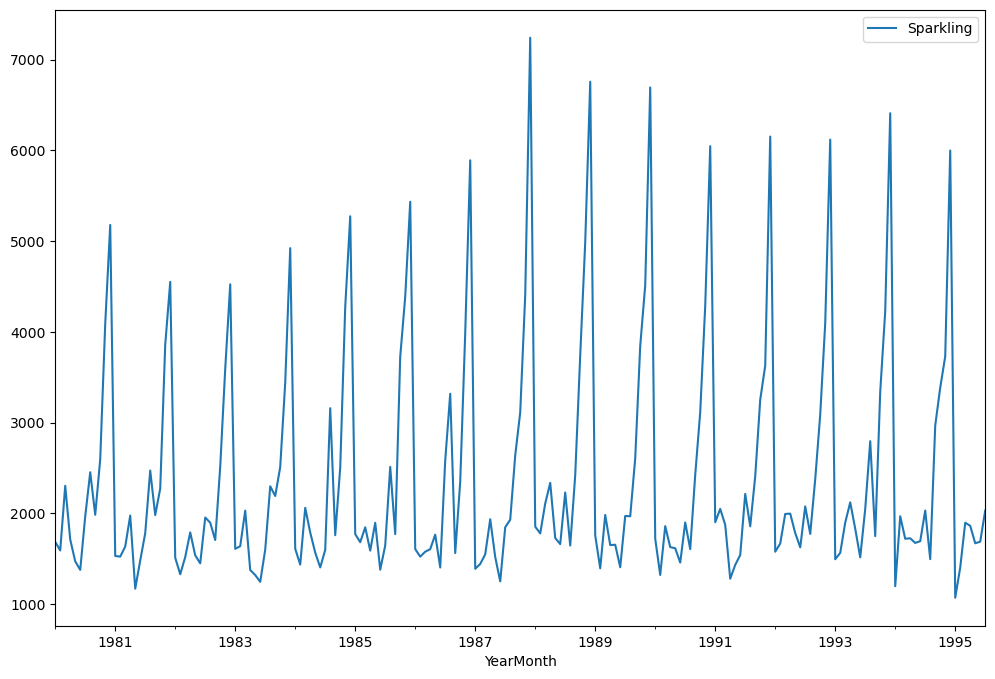

In [12]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 8
df.plot()
plt.show()

*We see an decreasing trend and seasonality which is not constant in nature.*

###### Yearly Boxplot

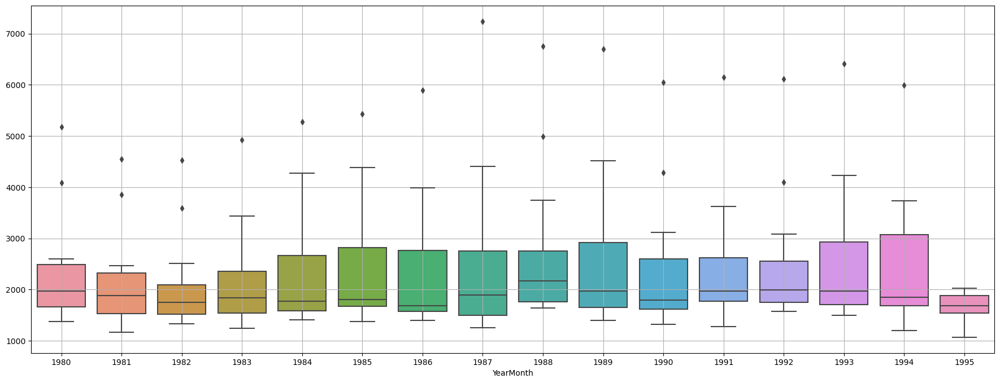

In [13]:
_, ax = plt.subplots(figsize=(22,8))
sns.boxplot(x = df.index.year,y = df.values[:,0],ax=ax)
plt.grid();

###### Monthly Boxplot

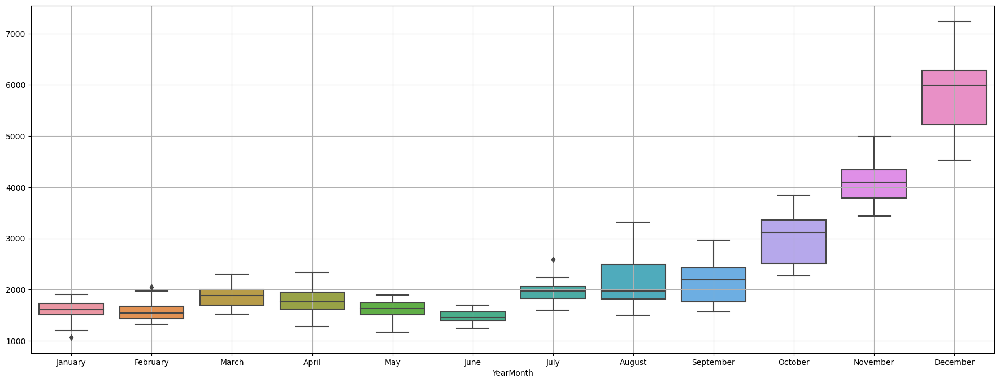

In [14]:
_, ax = plt.subplots(figsize=(22,8))
sns.boxplot(x = df.index.month_name(),y = df.values[:,0],ax=ax)
plt.grid();

*Maximum sales in the month of December*

*The sales seems to usually pick in the last 4 months*

*Average order is greater in december and lowest in june*

###### Monthly Boxplot

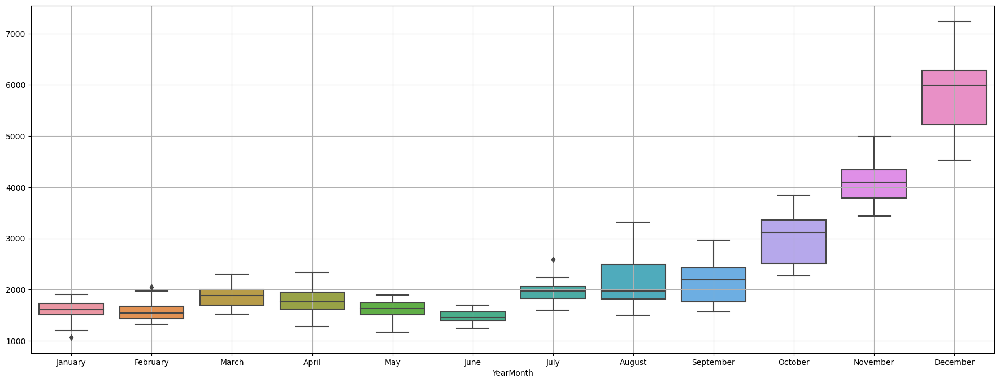

In [15]:
_, ax = plt.subplots(figsize=(22,8))
sns.boxplot(x = df.index.month_name(),y = df.values[:,0],ax=ax)
plt.grid();

###### Monthly sales across years.

In [16]:
monthly_sales_across_years = pd.pivot_table(df, values = 'Sparkling', columns = df.index.month_name(), index = df.index.year)
monthly_sales_across_years

YearMonth,April,August,December,February,January,July,June,March,May,November,October,September
YearMonth,,,,,,,,,,,,
1980,1712.0,2453.0,5179.0,1591.0,1686.0,1966.0,1377.0,2304.0,1471.0,4087.0,2596.0,1984.0
1981,1976.0,2472.0,4551.0,1523.0,1530.0,1781.0,1480.0,1633.0,1170.0,3857.0,2273.0,1981.0
1982,1790.0,1897.0,4524.0,1329.0,1510.0,1954.0,1449.0,1518.0,1537.0,3593.0,2514.0,1706.0
1983,1375.0,2298.0,4923.0,1638.0,1609.0,1600.0,1245.0,2030.0,1320.0,3440.0,2511.0,2191.0
1984,1789.0,3159.0,5274.0,1435.0,1609.0,1597.0,1404.0,2061.0,1567.0,4273.0,2504.0,1759.0
1985,1589.0,2512.0,5434.0,1682.0,1771.0,1645.0,1379.0,1846.0,1896.0,4388.0,3727.0,1771.0
1986,1605.0,3318.0,5891.0,1523.0,1606.0,2584.0,1403.0,1577.0,1765.0,3987.0,2349.0,1562.0
1987,1935.0,1930.0,7242.0,1442.0,1389.0,1847.0,1250.0,1548.0,1518.0,4405.0,3114.0,2638.0
1988,2336.0,1645.0,6757.0,1779.0,1853.0,2230.0,1661.0,2108.0,1728.0,4988.0,3740.0,2421.0


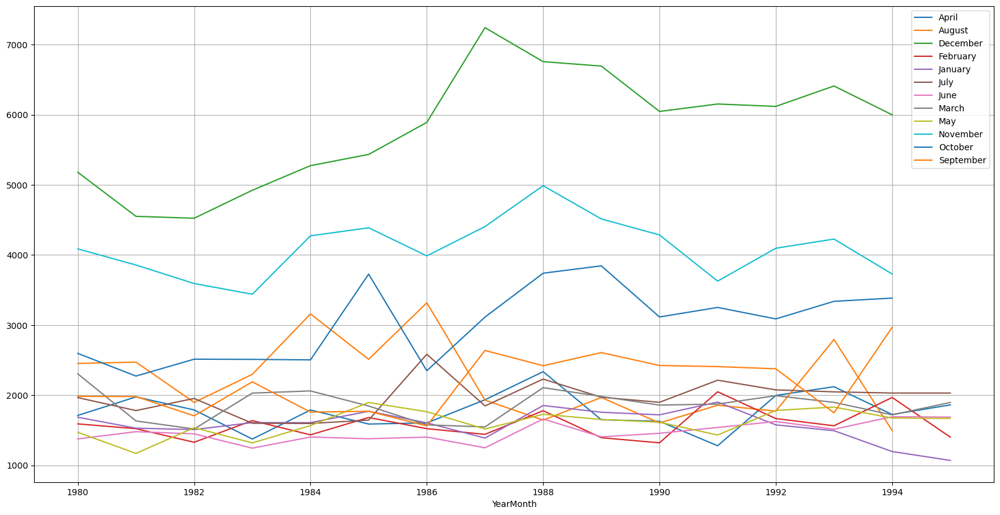

In [17]:
monthly_sales_across_years.plot(figsize=(20,10))
plt.grid()
plt.legend(loc='best');

*December consistently records the highest sales across all years, likely due to celebrations during the holiday season.*

*February consistently shows lower sales, likely due to seasonal or market factors.*



###### Annual Sales

In [18]:
df_year = df.resample('A').sum()
df_year

,Sparkling
YearMonth,
1980-12-31,28406
1981-12-31,26227
1982-12-31,25321
1983-12-31,26180
1984-12-31,28431
1985-12-31,29640
1986-12-31,29170
1987-12-31,30258
1988-12-31,33246


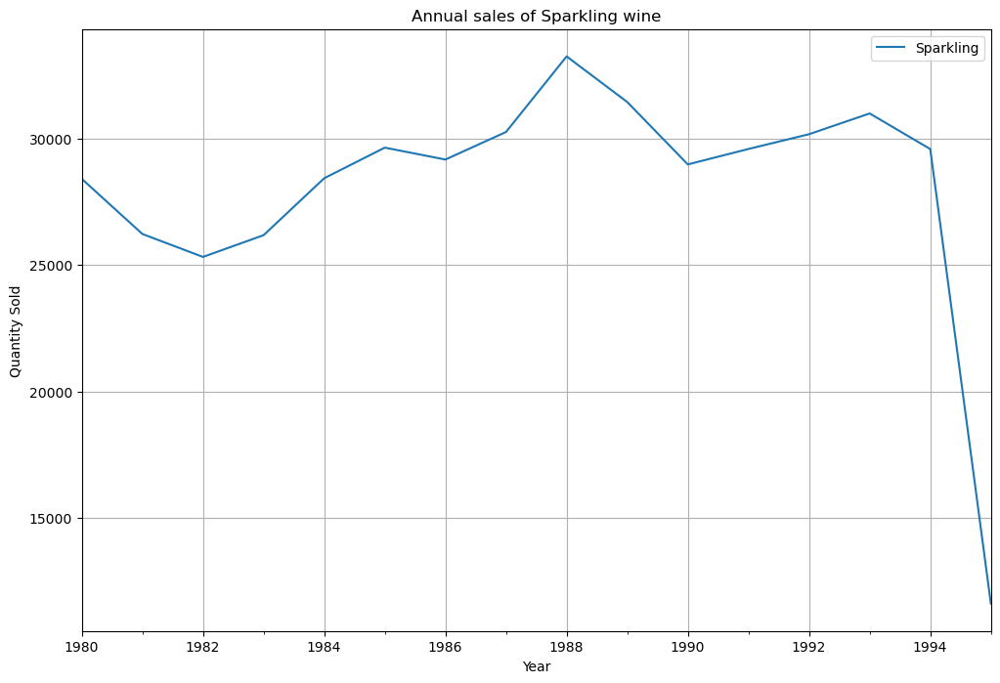

In [19]:
df_year.plot();
plt.grid()
plt.title('Annual sales of Sparkling wine');
plt.xlabel('Year')
plt.ylabel('Quantity Sold');

###### Quarter Sales

In [20]:
df_quarter = df.resample('Q').sum()
df_quarter.head(10)

,Sparkling
YearMonth,
1980-03-31,5581
1980-06-30,4560
1980-09-30,6403
1980-12-31,11862
1981-03-31,4686
1981-06-30,4626
1981-09-30,6234
1981-12-31,10681
1982-03-31,4357


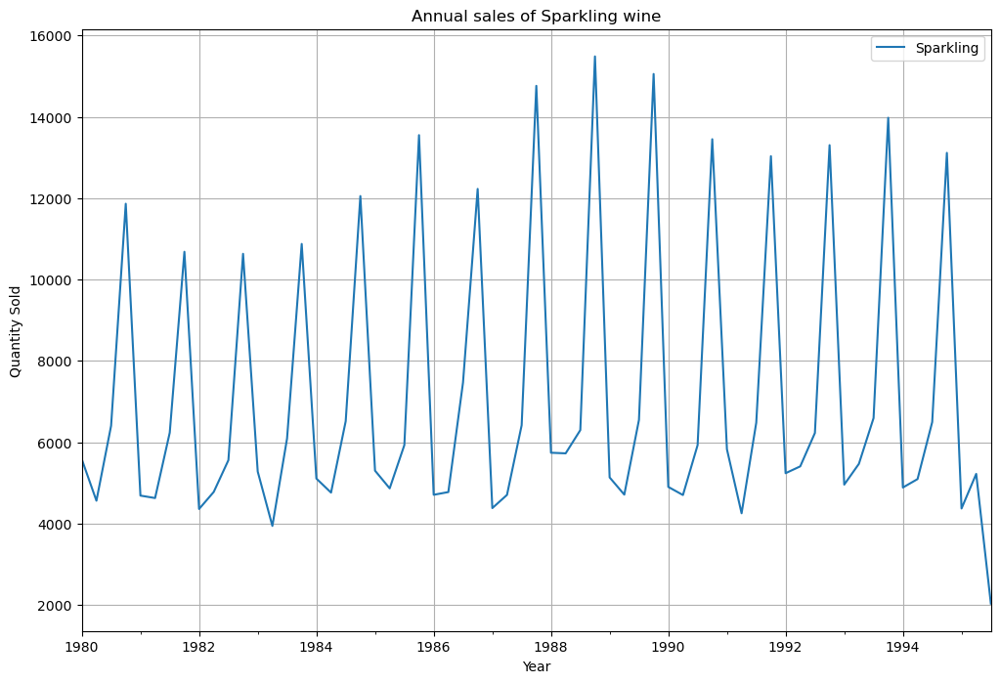

In [21]:
df_quarter.plot();
plt.grid()
plt.title('Annual sales of Sparkling wine');
plt.xlabel('Year')
plt.ylabel('Quantity Sold');

#### Seasonal Patterns

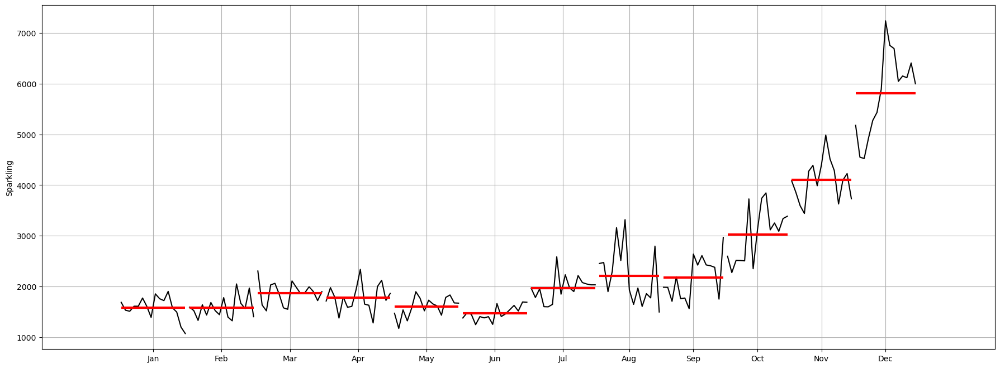

In [22]:
from statsmodels.graphics.tsaplots import month_plot

fig, ax = plt.subplots(figsize=(22,8))

month_plot(df,ylabel='Sparkling',ax=ax)
plt.grid();

## Missing values

In [23]:
df.isnull().sum()

Sparkling    0
dtype: int64

# Decompose the Time Series

### Additive Model

In [24]:
from statsmodels.tsa.seasonal import seasonal_decompose

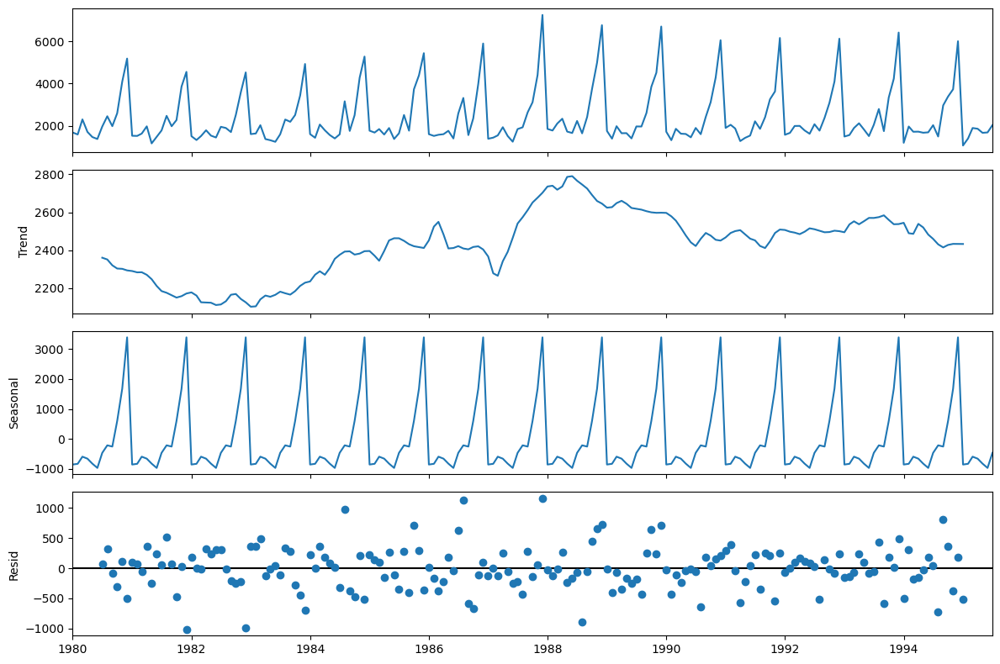

In [25]:
decomposition = seasonal_decompose(df,model='additive')
decomposition.plot();

In [26]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

In [27]:
print('Trend','\n',trend.round(2).head(12),'\n')
print('Seasonality','\n',seasonality.round(2).head(12),'\n')
print('Residual','\n',residual.round(2).head(12),'\n')

Trend 
 YearMonth
1980-01-01        NaN
1980-02-01        NaN
1980-03-01        NaN
1980-04-01        NaN
1980-05-01        NaN
1980-06-01        NaN
1980-07-01    2360.67
1980-08-01    2351.33
1980-09-01    2320.54
1980-10-01    2303.58
1980-11-01    2302.04
1980-12-01    2293.79
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    -854.26
1980-02-01    -830.35
1980-03-01    -592.36
1980-04-01    -658.49
1980-05-01    -824.42
1980-06-01    -967.43
1980-07-01    -465.50
1980-08-01    -214.33
1980-09-01    -254.68
1980-10-01     599.77
1980-11-01    1675.07
1980-12-01    3386.98
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01       NaN
1980-02-01       NaN
1980-03-01       NaN
1980-04-01       NaN
1980-05-01       NaN
1980-06-01       NaN
1980-07-01     70.84
1980-08-01    316.00
1980-09-01    -81.86
1980-10-01   -307.35
1980-11-01    109.89
1980-12-01   -501.78
Name: resid, dtype: float64 



In [28]:
deaseasonalized_ts = trend + residual
deaseasonalized_ts.round(2).head(12)

YearMonth
1980-01-01        NaN
1980-02-01        NaN
1980-03-01        NaN
1980-04-01        NaN
1980-05-01        NaN
1980-06-01        NaN
1980-07-01    2431.50
1980-08-01    2667.33
1980-09-01    2238.68
1980-10-01    1996.23
1980-11-01    2411.93
1980-12-01    1792.02
dtype: float64

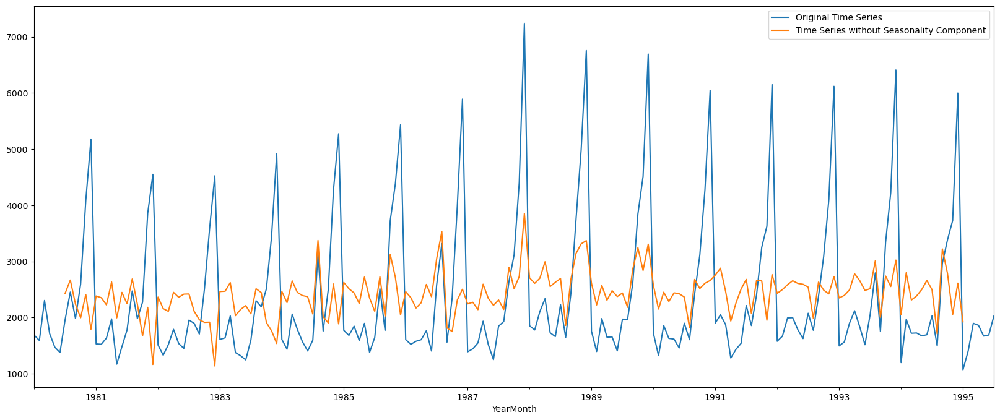

In [29]:
rcParams['figure.figsize'] = 20, 8
df.plot()
deaseasonalized_ts.plot()
plt.legend(["Original Time Series", "Time Series without Seasonality Component"]);

### Multiplicative Model

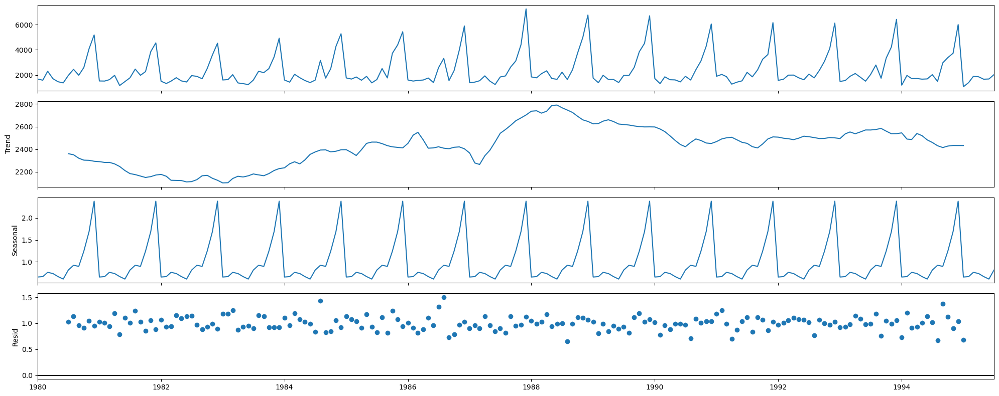

In [30]:
decomposition = seasonal_decompose(df,model='multiplicative')
decomposition.plot();

In [31]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.round(2).head(12),'\n')
print('Seasonality','\n',seasonality.round(2).head(12),'\n')
print('Residual','\n',residual.round(2).head(12),'\n')

Trend 
 YearMonth
1980-01-01        NaN
1980-02-01        NaN
1980-03-01        NaN
1980-04-01        NaN
1980-05-01        NaN
1980-06-01        NaN
1980-07-01    2360.67
1980-08-01    2351.33
1980-09-01    2320.54
1980-10-01    2303.58
1980-11-01    2302.04
1980-12-01    2293.79
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    0.65
1980-02-01    0.66
1980-03-01    0.76
1980-04-01    0.73
1980-05-01    0.66
1980-06-01    0.60
1980-07-01    0.81
1980-08-01    0.92
1980-09-01    0.89
1980-10-01    1.24
1980-11-01    1.69
1980-12-01    2.38
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01     NaN
1980-02-01     NaN
1980-03-01     NaN
1980-04-01     NaN
1980-05-01     NaN
1980-06-01     NaN
1980-07-01    1.03
1980-08-01    1.14
1980-09-01    0.96
1980-10-01    0.91
1980-11-01    1.05
1980-12-01    0.95
Name: resid, dtype: float64 



In [32]:
deaseasonalized_ts = trend + residual
deaseasonalized_ts.round(2).head(12)

YearMonth
1980-01-01        NaN
1980-02-01        NaN
1980-03-01        NaN
1980-04-01        NaN
1980-05-01        NaN
1980-06-01        NaN
1980-07-01    2361.70
1980-08-01    2352.47
1980-09-01    2321.50
1980-10-01    2304.49
1980-11-01    2303.09
1980-12-01    2294.74
dtype: float64

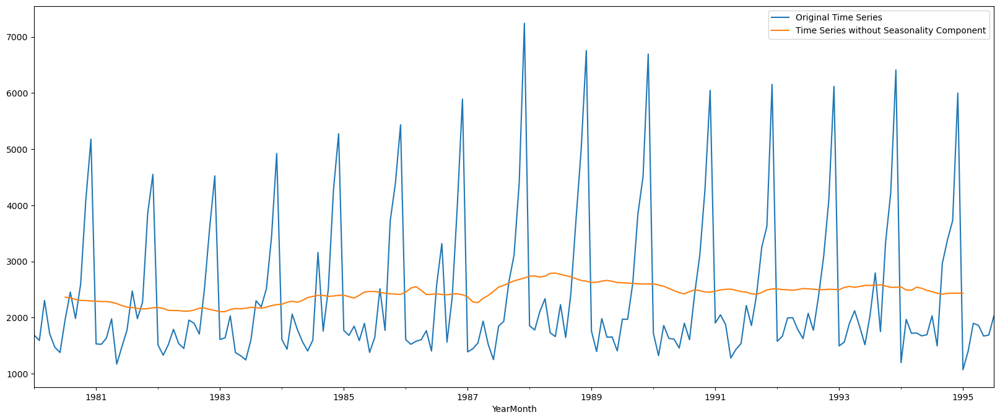

In [33]:
df.plot()
deaseasonalized_ts.plot()
plt.legend(["Original Time Series", "Time Series without Seasonality Component"]);

## Train-test split

In [34]:
train    =   df[0:int(len(df)*0.7)] 
test     =   df[int(len(df)*0.7):]

*The data is split into two distinct subsets: training and test datasets. This division is essential for developing and evaluating predictive models.*

$Training Set$ :*This subset includes the first 70% of the available data. It is used to fit and train the model, allowing it to learn the underlying patterns and trends from the historical sales data.*

$Test Set$: *The remaining 30% of the data is set aside as the test set. This portion is used to assess the model's performance and generalization ability. It simulates how the model will perform when applied to future, unseen data.*

By splitting the data in this way, we ensure that the model is trained on a large enough dataset, while still maintaining an independent portion for testing and validating its predictions. This process helps in assessing how well the model is likely to perform on real-world data, improving its reliability and robustness.

In [35]:
print(train.shape)
print(test.shape)

(130, 1)
(57, 1)


In [36]:
from IPython.display import display

In [37]:
print('First few rows of Training Data')
display(train.head())
print('Last few rows of Training Data')
display(train.tail())
print('First few rows of Test Data')
display(test.head())
print('Last few rows of Test Data')
display(test.tail())

First few rows of Training Data


,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


Last few rows of Training Data


,Sparkling
YearMonth,
1990-06-01,1457
1990-07-01,1899
1990-08-01,1605
1990-09-01,2424
1990-10-01,3116


First few rows of Test Data


,Sparkling
YearMonth,
1990-11-01,4286
1990-12-01,6047
1991-01-01,1902
1991-02-01,2049
1991-03-01,1874


Last few rows of Test Data


,Sparkling
YearMonth,
1995-03-01,1897
1995-04-01,1862
1995-05-01,1670
1995-06-01,1688
1995-07-01,2031


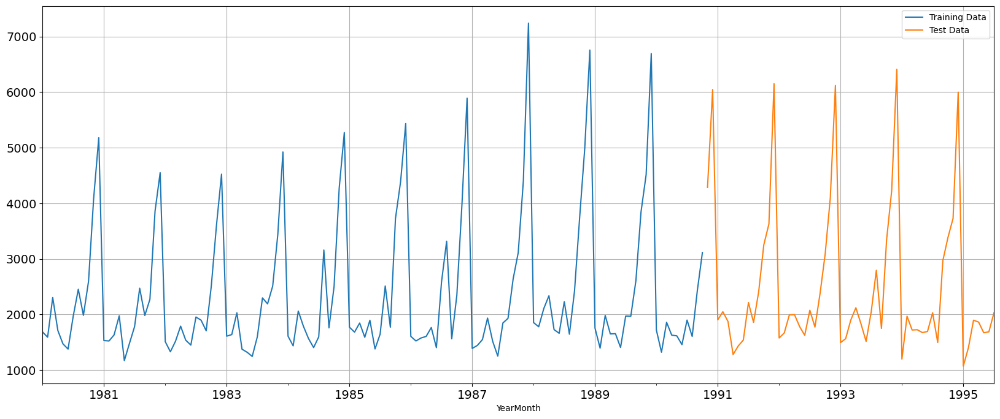

In [38]:
train['Sparkling'].plot(fontsize=14)
test['Sparkling'].plot(fontsize=14)
plt.grid()
plt.legend(['Training Data','Test Data'])
plt.show()

##### It is difficult to predict the future observations if such an instance has not happened in the past. From our train-test split we are predicting likewise behaviour as compared to the past years.

## Model Building - Original Data

### Model 1: Linear Regression

#### For this particular linear regression, we are going to regress the 'Rose' variable against the order of the occurrence. For this we need to modify our training data before fitting it into a linear regression.

In [39]:
train_time = [i+1 for i in range(len(train))]
test_time = [i+len(train)+1 for i in range(len(test))]
print('Training Time instance','\n',train_time)
print('\n')
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130]


Test Time instance 
 [131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


We see that we have successfully the generated the numerical time instance order for both the training and test set. Now we will add these values in the training and test set.

In [40]:
LinearRegression_train = train.copy()
LinearRegression_test = test.copy()

In [41]:
LinearRegression_train['Time'] = train_time
LinearRegression_test['Time'] = test_time

print('First few rows of Training Data','\n',LinearRegression_train.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test.tail(),'\n')

First few rows of Training Data 
             Sparkling  Time
YearMonth                  
1980-01-01       1686     1
1980-02-01       1591     2
1980-03-01       2304     3
1980-04-01       1712     4
1980-05-01       1471     5 

Last few rows of Training Data 
             Sparkling  Time
YearMonth                  
1990-06-01       1457   126
1990-07-01       1899   127
1990-08-01       1605   128
1990-09-01       2424   129
1990-10-01       3116   130 

First few rows of Test Data 
             Sparkling  Time
YearMonth                  
1990-11-01       4286   131
1990-12-01       6047   132
1991-01-01       1902   133
1991-02-01       2049   134
1991-03-01       1874   135 

Last few rows of Test Data 
             Sparkling  Time
YearMonth                  
1995-03-01       1897   183
1995-04-01       1862   184
1995-05-01       1670   185
1995-06-01       1688   186
1995-07-01       2031   187 



Now that our training and test data has been modified, let us go ahead use $\underline{Linear Regression}$ to build the model on the training data and test the model on the test data.

In [42]:
from sklearn.linear_model import LinearRegression

In [43]:
lr = LinearRegression()

In [44]:
lr.fit(LinearRegression_train[['Time']],LinearRegression_train['Sparkling'].values)

LinearRegression()

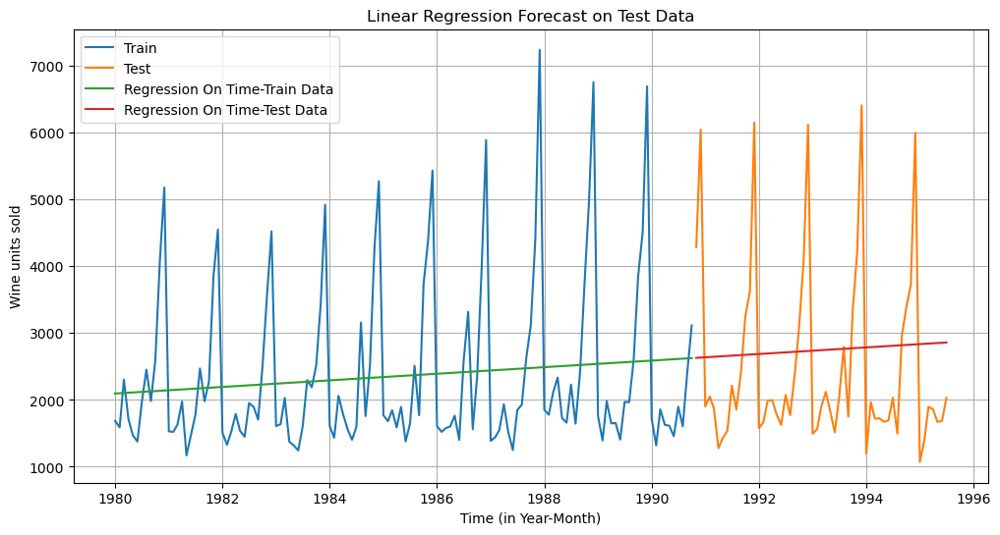

In [45]:
test_predictions_model1 = lr.predict(LinearRegression_test[['Time']])
LinearRegression_test['RegOnTime'] = test_predictions_model1

train_predictions_model1 = lr.predict(LinearRegression_train[['Time']])
LinearRegression_train['RegOnTime'] = train_predictions_model1

plt.figure(figsize=(12,6))
plt.title('Linear Regression Forecast on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine units sold')
plt.plot( train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')
plt.plot(LinearRegression_train['RegOnTime'], label='Regression On Time-Train Data')
plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time-Test Data')
plt.legend(loc='best')
plt.grid();

### Model Evaluation

In [46]:
# Test Data - RMSE

rmse_LR_test = metrics.mean_squared_error(test['Sparkling'],LinearRegression_test['RegOnTime'],squared=False)
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.3f" %(rmse_LR_test))

For RegressionOnTime forecast on the Test Data,  RMSE is 1392.438


In [47]:
resultsDf = pd.DataFrame({'Test RMSE': [rmse_LR_test]},index=['Linear Regression'])
resultsDf

,Test RMSE
Linear Regression,1392.438305


### Method 2: Simple Average

#### For this particular simple average method, we will forecast by using the average of the training values.

In [48]:
SimpleAverage_train = train.copy()
SimpleAverage_test = test.copy()

In [49]:
SimpleAverage_test['mean_forecast'] = train['Sparkling'].mean()
SimpleAverage_test.head()


,Sparkling,mean_forecast
YearMonth,,
1990-11-01,4286,2361.276923
1990-12-01,6047,2361.276923
1991-01-01,1902,2361.276923
1991-02-01,2049,2361.276923
1991-03-01,1874,2361.276923


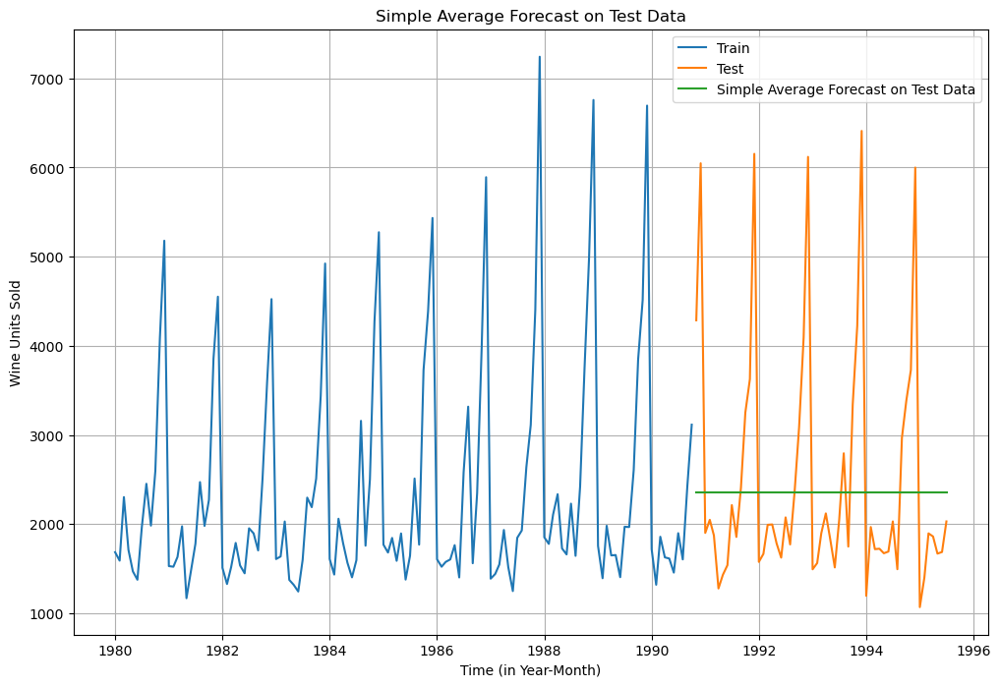

In [50]:
plt.figure(figsize=(12,8))
plt.title('Simple Average Forecast on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.plot(SimpleAverage_train['Sparkling'], label='Train')
plt.plot(SimpleAverage_test['Sparkling'], label='Test')
plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average Forecast on Test Data')
plt.legend(loc='best')
plt.grid();

### Model Evaluation

In [51]:
rmse_model2_test = metrics.mean_squared_error(test['Sparkling'],SimpleAverage_test['mean_forecast'],squared=False)
print("For Simple Average forecast on the Test Data,  RMSE is %3.3f" %(rmse_model2_test))

For Simple Average forecast on the Test Data,  RMSE is 1368.747


In [52]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_model2_test]}
                           ,index=['SimpleAverageModel'])

resultsDf = pd.concat([resultsDf, resultsDf_2])
resultsDf

,Test RMSE
Linear Regression,1392.438305
SimpleAverageModel,1368.746717


## Method 3: Moving Average(MA)

#### For the moving average model, we are going to calculate rolling means (or moving averages) for different intervals. The best interval can be determined by the maximum accuracy (or the minimum error) over here.

###### For Moving Average, we are going to average over the entire data.

In [53]:
MovingAverage = df.copy()
MovingAverage.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


#### Trailing moving averages

In [54]:

MovingAverage['Trailing_2'] = MovingAverage['Sparkling'].rolling(2).mean()
MovingAverage['Trailing_4'] = MovingAverage['Sparkling'].rolling(4).mean()
MovingAverage['Trailing_6'] = MovingAverage['Sparkling'].rolling(6).mean()
MovingAverage['Trailing_9'] = MovingAverage['Sparkling'].rolling(9).mean()

MovingAverage.head()

,Sparkling,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,1686,NaN,NaN,NaN,NaN
1980-02-01,1591,1638.5,NaN,NaN,NaN
1980-03-01,2304,1947.5,NaN,NaN,NaN
1980-04-01,1712,2008.0,1823.25,NaN,NaN
1980-05-01,1471,1591.5,1769.50,NaN,NaN


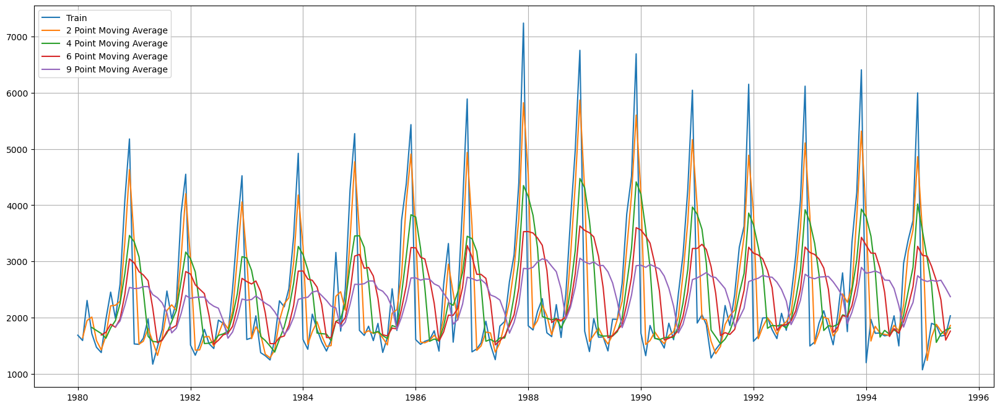

In [55]:
## Plotting on the whole data

plt.plot(MovingAverage['Sparkling'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')

plt.legend(loc = 'best')
plt.grid();

Let us split the data into train and test and plot this Time Series. The window of the moving average is need to be carefully selected as too big a window will result in not having any test set as the whole series might get averaged over.

In [56]:
#Creating train and test set 
trailing_MovingAverage_train=MovingAverage[0:int(len(MovingAverage)*0.7)] 
trailing_MovingAverage_test=MovingAverage[int(len(MovingAverage)*0.7):]

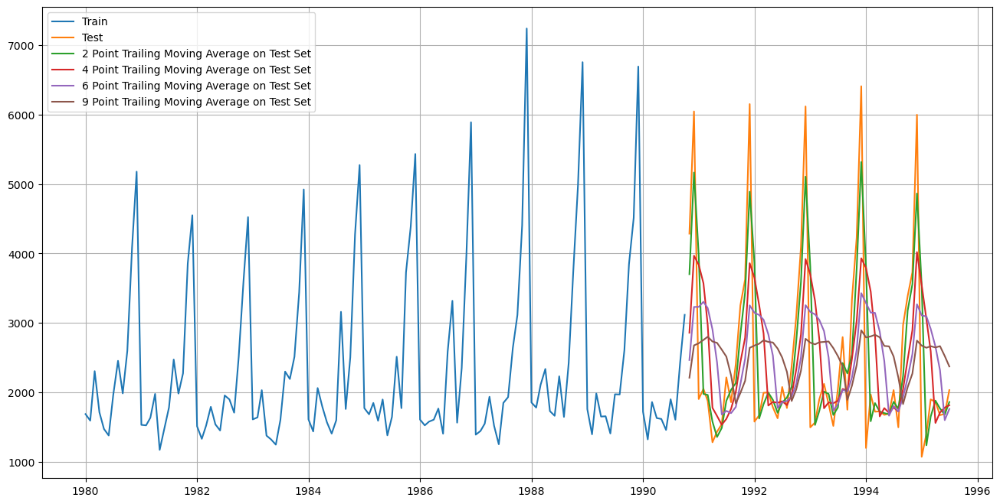

In [57]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_train['Sparkling'], label='Train')
plt.plot(trailing_MovingAverage_test['Sparkling'], label='Test')


plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')

plt.legend(loc = 'best')
plt.grid();

### Model Evaluation

##### Done only on the test data.

In [58]:
## Test Data - RMSE  --> 2 point Trailing MA

rmse_model3_test_2 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Trailing_2'],squared=False)
print("For 2 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_model3_test_2))

## Test Data - RMSE --> 4 point Trailing MA

rmse_model3_test_4 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Trailing_4'],squared=False)
print("For 4 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_model3_test_4))

## Test Data - RMSE --> 6 point Trailing MA

rmse_model3_test_6 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Trailing_6'],squared=False)
print("For 6 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_model3_test_6))

## Test Data - RMSE --> 9 point Trailing MA

rmse_model3_test_9 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Trailing_9'],squared=False)
print("For 9 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_model3_test_9))

For 2 point Moving Average Model forecast on the Training Data,  RMSE is 811.179
For 4 point Moving Average Model forecast on the Training Data,  RMSE is 1184.213
For 6 point Moving Average Model forecast on the Training Data,  RMSE is 1337.201
For 9 point Moving Average Model forecast on the Training Data,  RMSE is 1422.653


In [59]:
resultsDf_3 = pd.DataFrame({'Test RMSE': [rmse_model3_test_2,rmse_model3_test_4
                                          ,rmse_model3_test_6,rmse_model3_test_9]}
                           ,index=['2pointTrailingMovingAverage','4pointTrailingMovingAverage'
                                   ,'6pointTrailingMovingAverage','9pointTrailingMovingAverage'])

resultsDf = pd.concat([resultsDf, resultsDf_3])
resultsDf

,Test RMSE
Linear Regression,1392.438305
SimpleAverageModel,1368.746717
2pointTrailingMovingAverage,811.178937
4pointTrailingMovingAverage,1184.213295
6pointTrailingMovingAverage,1337.200524
9pointTrailingMovingAverage,1422.653281


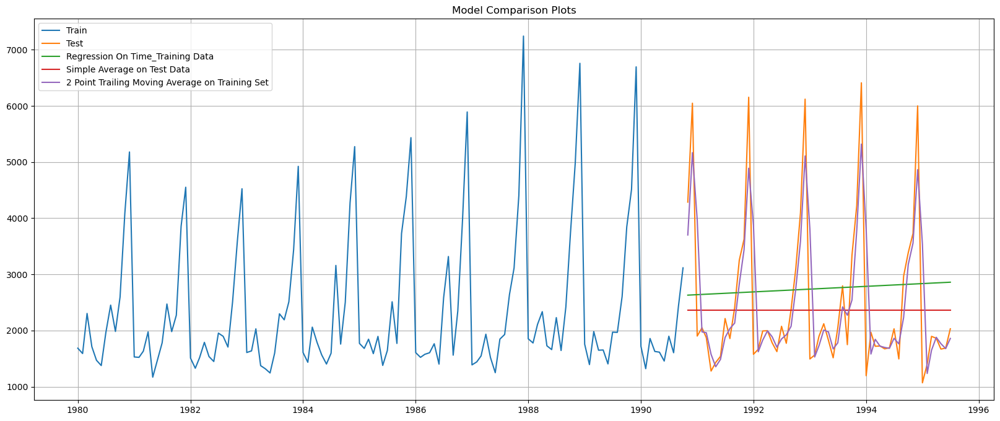

In [60]:
## Plotting on both Training and Test data

plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')

plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time_Training Data')

plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average on Test Data')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')


plt.legend(loc='best')
plt.title("Model Comparison Plots")
plt.grid();

## Model 5: Simple Exponential Smoothing

In [61]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [62]:
SES_train = train.copy()
SES_test = test.copy()

In [63]:
model_SES = SimpleExpSmoothing(SES_train['Sparkling'])

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [64]:
model_SES_autofit = model_SES.fit(optimized=True)

In [65]:
model_SES_autofit.params

{'smoothing_level': 0.037534298998536025,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [66]:
SES_test['predict'] = model_SES_autofit.forecast(steps=len(test))
SES_test.head()

,Sparkling,predict
YearMonth,,
1990-11-01,4286,2465.235698
1990-12-01,6047,2465.235698
1991-01-01,1902,2465.235698
1991-02-01,2049,2465.235698
1991-03-01,1874,2465.235698


Text(0, 0.5, 'Wine Units Sold')

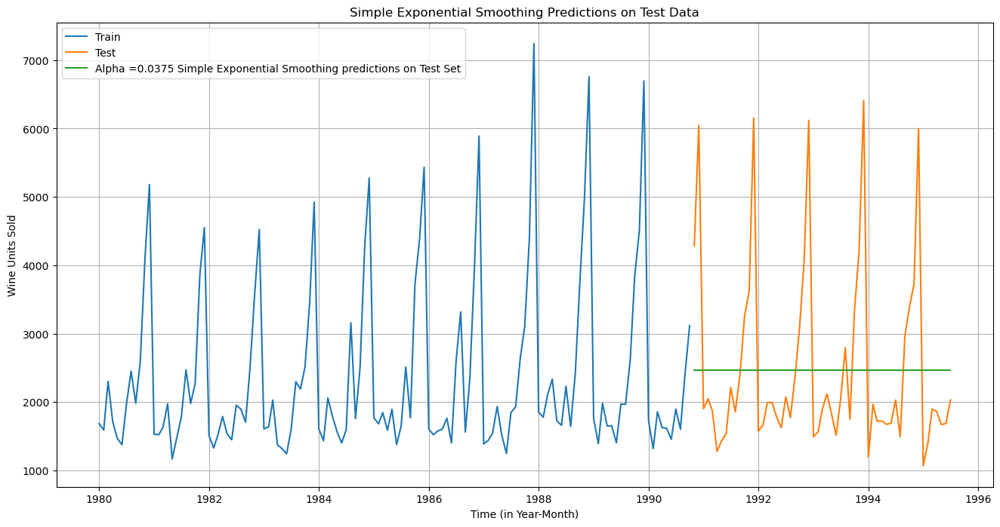

In [67]:
plt.figure(figsize=(16,8))
plt.plot(SES_train['Sparkling'], label='Train')
plt.plot(SES_test['Sparkling'], label='Test')

plt.plot(SES_test['predict'], label='Alpha =0.0375 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple Exponential Smoothing Predictions on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

#### Model Evaluation for α= 0.0375 : Simple Exponential Smoothing

In [68]:
rmse_model5_test_1 = metrics.mean_squared_error(SES_test['Sparkling'],SES_test['predict'],squared=False)
print("For Alpha =0.0375 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_model5_test_1))

For Alpha =0.0375 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is 1362.429


In [69]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_model5_test_1]},index=['Alpha =0.0375,SimpleExponentialSmoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_5])
resultsDf

,Test RMSE
Linear Regression,1392.438305
SimpleAverageModel,1368.746717
2pointTrailingMovingAverage,811.178937
4pointTrailingMovingAverage,1184.213295
6pointTrailingMovingAverage,1337.200524
9pointTrailingMovingAverage,1422.653281
"Alpha =0.0375,SimpleExponentialSmoothing",1362.428949


In [70]:
resultsDf_6 = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_6

,Alpha Values,Train RMSE,Test RMSE


In [71]:
for i in np.arange(0.1, 1, 0.05):
    # Fit SES model
    model_SES_alpha_i = model_SES.fit(smoothing_level=i, optimized=False, use_brute=True)
    
    # Store predictions
    SES_train[f'predict_{i}'] = model_SES_alpha_i.fittedvalues
    SES_test[f'predict_{i}'] = model_SES_alpha_i.forecast(steps=len(SES_test))
    
    # Compute RMSE for train and test sets
    rmse_model5_train_i = metrics.mean_squared_error(
        SES_train['Sparkling'], SES_train[f'predict_{i}'], squared=False
    )
    rmse_model5_test_i = metrics.mean_squared_error(
        SES_test['Sparkling'], SES_test[f'predict_{i}'], squared=False
    )
    
    # Create temporary DataFrame for current alpha value
    temp_resultsDf = pd.DataFrame({
        'Alpha Values': [i],
        'Train RMSE': [rmse_model5_train_i],
        'Test RMSE': [rmse_model5_test_i]
    })
    
    # Append to results DataFrame using pd.concat
    resultsDf_6 = pd.concat([resultsDf_6, temp_resultsDf], ignore_index=True)

In [72]:
resultsDf_6.sort_values(by=['Test RMSE'],ascending=True)

,Alpha Values,Train RMSE,Test RMSE
7,0.45,1327.999697,1362.187063
6,0.40,1329.814823,1363.037803
8,0.50,1326.403864,1364.863549
5,0.35,1331.152869,1366.893767
0,0.10,1298.211536,1367.395642
9,0.55,1325.503170,1370.948695
4,0.30,1331.102204,1372.323705
1,0.15,1312.518677,1374.658019
3,0.25,1328.611553,1377.005722
2,0.20,1322.658289,1378.320562


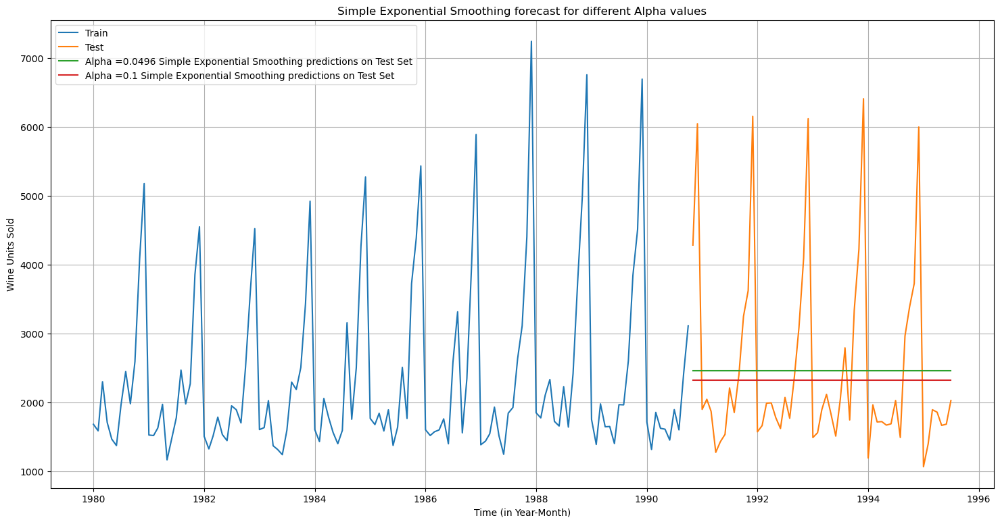

In [73]:
## Plotting on both the Training and Test data
model_SES_alpha_i = model_SES.fit(smoothing_level=0.3,optimized=False,use_brute=True)
SES_train['predict',0.1] = model_SES_alpha_i.fittedvalues
SES_test['predict',0.1] = model_SES_alpha_i.forecast(steps=len(test))

plt.figure(figsize=(18,9))
plt.plot(SES_train['Sparkling'], label='Train')
plt.plot(SES_test['Sparkling'], label='Test')

plt.plot(SES_test['predict'], label='Alpha =0.0496 Simple Exponential Smoothing predictions on Test Set')

plt.plot(SES_test['predict',0.1], label='Alpha =0.1 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.title('Simple Exponential Smoothing forecast for different Alpha values')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();


## Method 6: Double Exponential Smoothing (Holt's Model)

### Two parameters $\alpha$ and $\beta$ are estimated in this model. Level and Trend are accounted for in this model.

In [74]:
DES_train = train.copy()
DES_test = test.copy()

In [75]:
# Initializing the Double Exponential Smoothing Model
model_DES = Holt(DES_train)
# Fitting the model
model_DES = model_DES.fit(optimized=True, use_brute=True)

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [76]:
model_DES.params

{'smoothing_level': 0.6414285714285713,
 'smoothing_trend': 0.0001,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': -95.0,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [77]:
# Forecasting using this model for the test set
DES_test['predict'] =  model_DES.forecast(len(test))
DES_test['predict']

YearMonth
1990-11-01    2623.902015
1990-12-01    2530.231452
1991-01-01    2436.560888
1991-02-01    2342.890325
1991-03-01    2249.219761
1991-04-01    2155.549198
1991-05-01    2061.878634
1991-06-01    1968.208071
1991-07-01    1874.537507
1991-08-01    1780.866944
1991-09-01    1687.196380
1991-10-01    1593.525817
1991-11-01    1499.855253
1991-12-01    1406.184690
1992-01-01    1312.514126
1992-02-01    1218.843563
1992-03-01    1125.172999
1992-04-01    1031.502436
1992-05-01     937.831872
1992-06-01     844.161309
1992-07-01     750.490745
1992-08-01     656.820181
1992-09-01     563.149618
1992-10-01     469.479054
1992-11-01     375.808491
1992-12-01     282.137927
1993-01-01     188.467364
1993-02-01      94.796800
1993-03-01       1.126237
1993-04-01     -92.544327
1993-05-01    -186.214890
1993-06-01    -279.885454
1993-07-01    -373.556017
1993-08-01    -467.226581
1993-09-01    -560.897144
1993-10-01    -654.567708
1993-11-01    -748.238271
1993-12-01    -841.908835
19

Text(0, 0.5, 'Wine Units Sold')

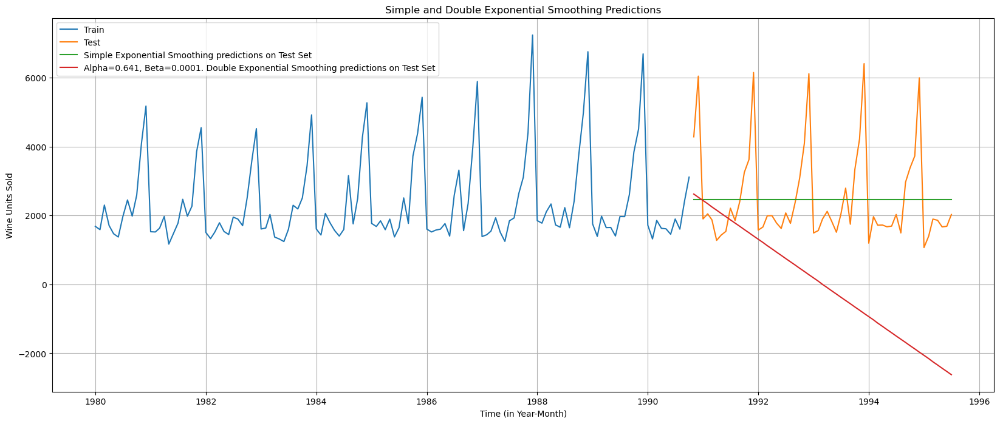

In [78]:
plt.plot(DES_train, label='Train')
plt.plot(DES_test['Sparkling'], label='Test')

plt.plot(SES_test['predict'], label='Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict'], label='Alpha=0.641, Beta=0.0001. Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple and Double Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

### Model Evaluation - Double Exponential Smoothing(Holt's Model)

In [79]:
rmse_DES_test = metrics.mean_squared_error(DES_test['Sparkling'],DES_test['predict'],squared=False)
print("For DES forecast on the Sparkling Testing Data:  RMSE is %3.3f" %(rmse_DES_test))

For DES forecast on the Rose Testing Data:  RMSE is 3173.262


In [80]:
resultsDf_6 = pd.DataFrame({'Test RMSE': [rmse_DES_test]},index=['Alpha=0.641, Beta=0.0001, Double Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_6])
resultsDf

,Test RMSE
Linear Regression,1392.438305
SimpleAverageModel,1368.746717
2pointTrailingMovingAverage,811.178937
4pointTrailingMovingAverage,1184.213295
6pointTrailingMovingAverage,1337.200524
9pointTrailingMovingAverage,1422.653281
"Alpha =0.0375,SimpleExponentialSmoothing",1362.428949
"Alpha=0.641, Beta=0.0001, Double Exponential Smoothing",3173.262078


In [81]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_6 = pd.DataFrame({'Alpha':[],'Beta':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_6

,Alpha,Beta,Train RMSE,Test RMSE


In [82]:
model_DES = Holt(DES_train['Sparkling'])
for i in np.arange(0.05,1.05,0.05):
    for j in np.arange(0.05,1.05,0.05):
        model_DES_alpha_i_j = model_DES.fit(smoothing_level=i,smoothing_trend=j,optimized=False,use_brute=True)
        DES_train['predict',i,j] = model_DES_alpha_i_j.fittedvalues
        DES_test['predict',i,j] = model_DES_alpha_i_j.forecast(len(test))
        
        rmse_model6_train = metrics.mean_squared_error(DES_train['Sparkling'],DES_train['predict',i,j],squared=False)
        
        rmse_model6_test = metrics.mean_squared_error(DES_test['Sparkling'],DES_test['predict',i,j],squared=False)
        temp_resultsDf = pd.DataFrame({
            'Alpha': [i],
            'Beta': [j],
            'Train RMSE': [rmse_model6_train],
            'Test RMSE': [rmse_model6_test]
        })
        resultsDf_6 = pd.concat([resultsDf_6, temp_resultsDf], ignore_index=True)

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [83]:
resultsDf_6

,Alpha,Beta,Train RMSE,Test RMSE
0,0.05,0.05,1402.191583,1359.261034
1,0.05,0.10,1353.181658,1413.947967
2,0.05,0.15,1346.342778,1593.429651
3,0.05,0.20,1346.847644,1917.321219
4,0.05,0.25,1353.410120,2117.093224
...,...,...,...,...
395,1.00,0.80,1915.148280,23241.839479
396,1.00,0.85,1956.316003,23586.366043
397,1.00,0.90,1999.362743,23787.747852
398,1.00,0.95,2044.627930,23834.631629


In [84]:

resultsDf_6.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Test RMSE
0,0.05,0.05,1402.191583,1359.261034
160,0.45,0.05,1364.634172,1363.379320
141,0.40,0.10,1402.987160,1369.139116
140,0.40,0.05,1367.180784,1373.477622
180,0.50,0.05,1362.111563,1387.339527


Text(0, 0.5, 'Wine Units Sold')

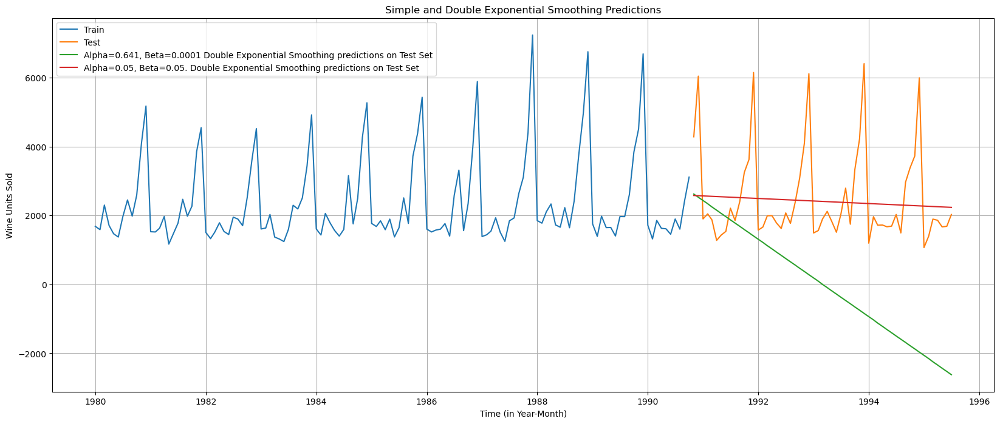

In [85]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(DES_train['Sparkling'], label='Train')
plt.plot(DES_test['Sparkling'], label='Test')

plt.plot(DES_test['predict'], label='Alpha=0.641, Beta=0.0001 Double Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict',0.05,0.05], label='Alpha=0.05, Beta=0.05. Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple and Double Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [86]:
DES_Model2_rmse = float(resultsDf_6[(resultsDf_6['Alpha']==0.05) & (resultsDf_6['Beta']==0.05)]['Test RMSE'])
DES_Model2_rmse

1359.2610342231606

In [87]:
resultsDf_6 = pd.DataFrame({'Test RMSE': [DES_Model2_rmse]},index=['Alpha=0.05, Beta=0.05, Double Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_6])
resultsDf

,Test RMSE
Linear Regression,1392.438305
SimpleAverageModel,1368.746717
2pointTrailingMovingAverage,811.178937
4pointTrailingMovingAverage,1184.213295
6pointTrailingMovingAverage,1337.200524
9pointTrailingMovingAverage,1422.653281
"Alpha =0.0375,SimpleExponentialSmoothing",1362.428949
"Alpha=0.641, Beta=0.0001, Double Exponential Smoothing",3173.262078
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",1359.261034


## Method 7: Triple Exponential Smoothing (Holt - Winter's Model)

##### Three parameters $\alpha$, $\beta$ and $\gamma$ are estimated in this model. Level, Trend and Seasonality are accounted for in this model.

In [88]:
TES_train = train.copy()
TES_test = test.copy()

In [89]:
model_TES = ExponentialSmoothing(TES_train['Sparkling'],trend='additive',seasonal='multiplicative')

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [90]:
model_TES_autofit = model_TES.fit(optimized=True)

In [91]:
model_TES_autofit.params

{'smoothing_level': 0.07571432471504627,
 'smoothing_trend': 0.06489794789923221,
 'smoothing_seasonal': 0.3765611795178487,
 'damping_trend': nan,
 'initial_level': 2356.5416847960546,
 'initial_trend': -9.182360270735833,
 'initial_seasons': array([0.71216394, 0.67829895, 0.89649052, 0.79723125, 0.64100433,
        0.63985644, 0.86674058, 1.1133546 , 0.89819179, 1.18511974,
        1.83459596, 2.32779881]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [92]:
TES_test['auto_predict'] = model_TES_autofit.forecast(steps=len(test))
TES_test.head()

,Sparkling,auto_predict
YearMonth,,
1990-11-01,4286,4327.606504
1990-12-01,6047,6208.854292
1991-01-01,1902,1621.602282
1991-02-01,2049,1379.868255
1991-03-01,1874,1791.914776


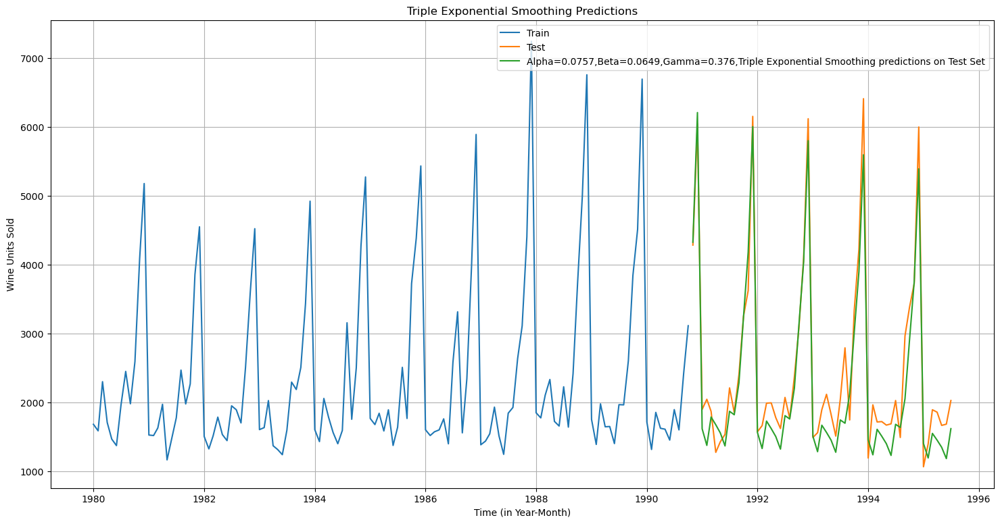

In [93]:
plt.figure(figsize=(18,9))
plt.plot(TES_train['Sparkling'], label='Train')
plt.plot(TES_test['Sparkling'], label='Test')

plt.plot(TES_test['auto_predict'], label='Alpha=0.0757,Beta=0.0649,Gamma=0.376,Triple Exponential Smoothing predictions on Test Set')


plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

In [94]:
rmse_tes_test = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['auto_predict'],squared=False)
print("For Alpha=0.0757,Beta=0.0649,Gamma=0.376, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is %3.3f" %(rmse_tes_test))

For Alpha=0.0757,Beta=0.0649,Gamma=0.376, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is 381.655


In [95]:
resultsDf_7 = pd.DataFrame({'Test RMSE': [rmse_tes_test]}
                           ,index=['Alpha=0.0757,Beta=0.0649,Gamma=0.376,Triple Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_7])
resultsDf

,Test RMSE
Linear Regression,1392.438305
SimpleAverageModel,1368.746717
2pointTrailingMovingAverage,811.178937
4pointTrailingMovingAverage,1184.213295
6pointTrailingMovingAverage,1337.200524
9pointTrailingMovingAverage,1422.653281
"Alpha =0.0375,SimpleExponentialSmoothing",1362.428949
"Alpha=0.641, Beta=0.0001, Double Exponential Smoothing",3173.262078
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",1359.261034
"Alpha=0.0757,Beta=0.0649,Gamma=0.376,Triple Exponential Smoothing",381.655272


In [96]:
resultsDf_8_2 = pd.DataFrame({'Alpha':[],'Beta':[],'Gamma':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_8_2

,Alpha,Beta,Gamma,Train RMSE,Test RMSE


In [97]:
for i in np.arange(0.1, 1.05, 0.05):  # Smoothing level (alpha)
    for j in np.arange(0.1, 1.05, 0.05):  # Smoothing trend (beta)
        for k in np.arange(0.1, 1.05, 0.05):  # Smoothing seasonal (gamma)
            # Fit TES model with specified smoothing parameters
            model_TES_alpha_i_j_k = ExponentialSmoothing(
                TES_train['Sparkling'], trend='multiplicative', seasonal='multiplicative'
            ).fit(smoothing_level=i, smoothing_trend=j, smoothing_seasonal=k, optimized=False, use_brute=True)
            TES_train[f'predict_{i}_{j}_{k}'] = model_TES_alpha_i_j_k.fittedvalues
            TES_test[f'predict_{i}_{j}_{k}'] = model_TES_alpha_i_j_k.forecast(steps=len(TES_test))
            
            # Compute RMSE for train and test sets
            rmse_model8_train = metrics.mean_squared_error(
                TES_train['Sparkling'], TES_train[f'predict_{i}_{j}_{k}'], squared=False
            )
            rmse_model8_test = metrics.mean_squared_error(
                TES_test['Sparkling'], TES_test[f'predict_{i}_{j}_{k}'], squared=False
            )
            
            # Create a temporary DataFrame for the current combination of alpha, beta, gamma
            temp_resultsDf = pd.DataFrame({
                'Alpha': [i],
                'Beta': [j],
                'Gamma': [k],
                'Train RMSE': [rmse_model8_train],
                'Test RMSE': [rmse_model8_test]
            })
            
            # Append the temporary DataFrame to resultsDf_8_2 using pd.concat
            resultsDf_8_2 = pd.concat([resultsDf_8_2, temp_resultsDf], ignore_index=True)

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\stats

ValueError: Input contains infinity or a value too large for dtype('float64').

In [98]:
resultsDf_8_2

,Alpha,Beta,Gamma,Train RMSE,Test RMSE
0,0.10,0.1,0.10,3.798169e+02,6.416850e+02
1,0.10,0.1,0.15,3.733623e+02,6.290337e+02
2,0.10,0.1,0.20,3.685861e+02,6.183970e+02
3,0.10,0.1,0.25,3.653281e+02,6.087713e+02
4,0.10,0.1,0.30,3.634558e+02,5.995105e+02
...,...,...,...,...,...
4326,0.65,1.0,0.75,2.138002e+05,1.336393e+04
4327,0.65,1.0,0.80,5.395104e+04,2.838614e+03
4328,0.65,1.0,0.85,8.007201e+06,1.728442e+49
4329,0.65,1.0,0.90,2.385967e+12,1.005787e+06


In [99]:
resultsDf_8_2.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Gamma,Train RMSE,Test RMSE
831,0.20,0.35,0.80,473.106041,322.096241
815,0.20,0.30,0.95,515.681423,339.358968
3250,0.55,0.10,0.15,399.161749,342.194322
2908,0.50,0.15,0.15,398.030115,346.283542
3973,0.65,0.10,0.20,415.346660,347.396254


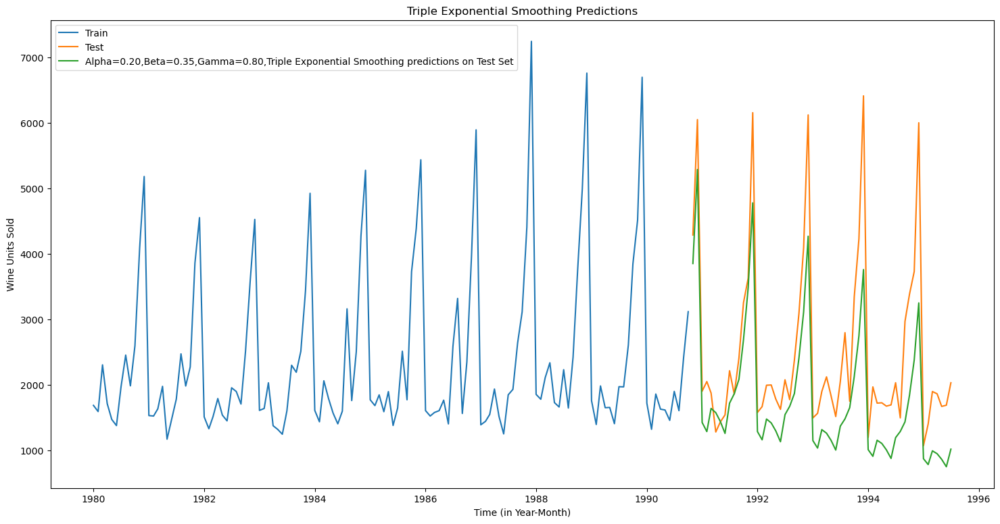

In [100]:
model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=0.35,smoothing_trend=0.10,smoothing_seasonal=0.20,optimized=False,use_brute=True)
TES_train['predict',0.20,0.35,0.80] = model_TES_alpha_i_j_k.fittedvalues
TES_test['predict',0.20,0.35,0.80] = model_TES_alpha_i_j_k.forecast(steps=len(test))
rmse_tes_test_lowest = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['predict',0.20,0.35,0.80],squared=False)

plt.figure(figsize=(18,9))
plt.plot(TES_train['Sparkling'], label='Train')
plt.plot(TES_test['Sparkling'], label='Test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_test['predict', 0.20,0.35,0.80], label='Alpha=0.20,Beta=0.35,Gamma=0.80,Triple Exponential Smoothing predictions on Test Set')


plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();
plt.grid();

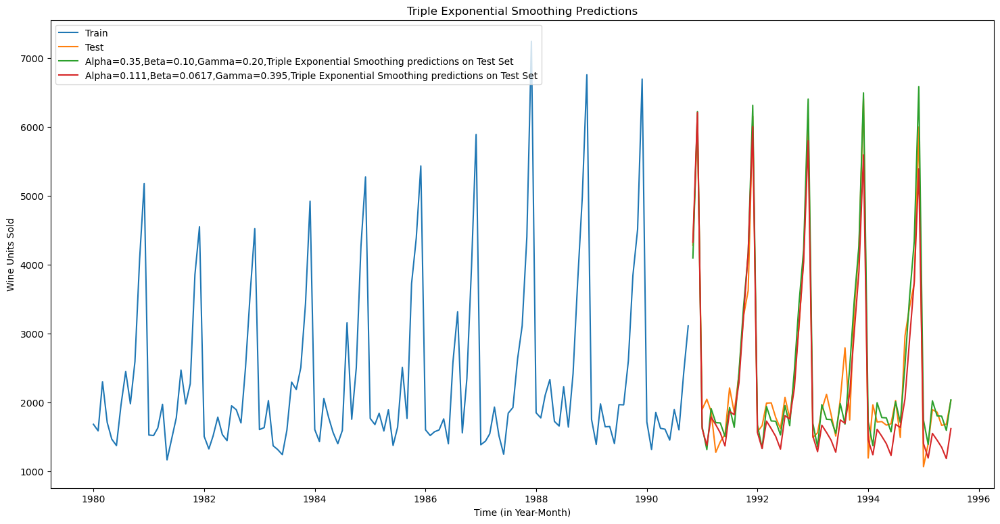

In [101]:
model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=0.20,smoothing_trend=0.35,smoothing_seasonal=0.80,optimized=False,use_brute=True)
TES_train['predict',0.20,0.35,0.80] = model_TES_alpha_i_j_k.fittedvalues
TES_test['predict',0.20,0.35,0.80] = model_TES_alpha_i_j_k.forecast(steps=len(test))
rmse_tes_test_lowest = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['predict',0.20,0.35,0.80],squared=False)

plt.figure(figsize=(18,9))
plt.plot(TES_train['Sparkling'], label='Train')
plt.plot(TES_test['Sparkling'], label='Test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_test['predict', 0.20,0.35,0.80], label='Alpha=0.35,Beta=0.10,Gamma=0.20,Triple Exponential Smoothing predictions on Test Set')
plt.plot(TES_test['auto_predict'], label='Alpha=0.111,Beta=0.0617,Gamma=0.395,Triple Exponential Smoothing predictions on Test Set')


plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();
plt.grid();

In [102]:
resultsDf_8 = pd.DataFrame({'Test RMSE': [rmse_tes_test_lowest]}
                           ,index=['Alpha=0.20,Beta=0.35,Gamma=0.80,Triple Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_8])
resultsDf

,Test RMSE
Linear Regression,1392.438305
SimpleAverageModel,1368.746717
2pointTrailingMovingAverage,811.178937
4pointTrailingMovingAverage,1184.213295
6pointTrailingMovingAverage,1337.200524
9pointTrailingMovingAverage,1422.653281
"Alpha =0.0375,SimpleExponentialSmoothing",1362.428949
"Alpha=0.641, Beta=0.0001, Double Exponential Smoothing",3173.262078
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",1359.261034
"Alpha=0.0757,Beta=0.0649,Gamma=0.376,Triple Exponential Smoothing",381.655272


In [103]:
print('Sorted by RMSE values on the Test Data:','\n',)
resultsDf.sort_values(by=['Test RMSE'])

Sorted by RMSE values on the Test Data: 



,Test RMSE
"Alpha=0.20,Beta=0.35,Gamma=0.80,Triple Exponential Smoothing",326.867284
"Alpha=0.0757,Beta=0.0649,Gamma=0.376,Triple Exponential Smoothing",381.655272
2pointTrailingMovingAverage,811.178937
4pointTrailingMovingAverage,1184.213295
6pointTrailingMovingAverage,1337.200524
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",1359.261034
"Alpha =0.0375,SimpleExponentialSmoothing",1362.428949
SimpleAverageModel,1368.746717
Linear Regression,1392.438305
9pointTrailingMovingAverage,1422.653281


Text(0, 0.5, 'Wine Units Sold')

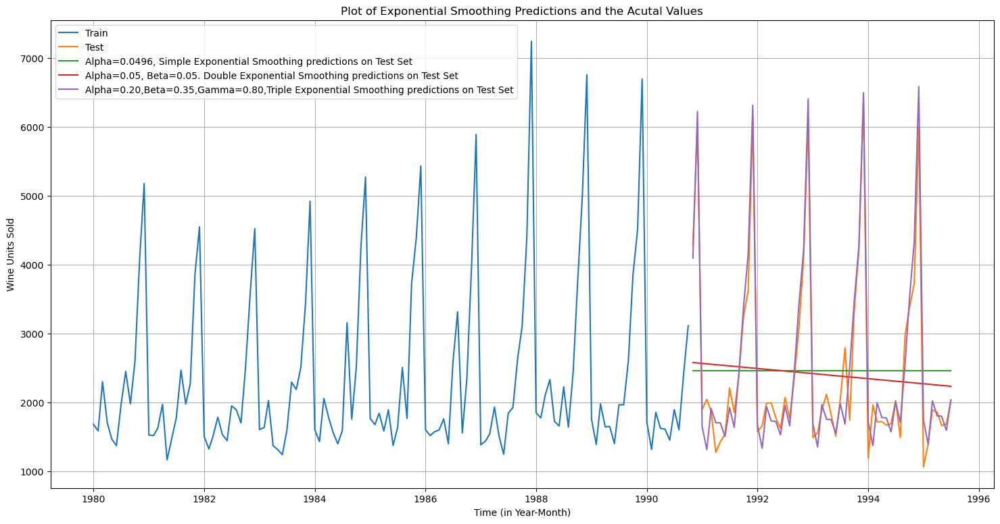

In [104]:
plt.figure(figsize=(18,9))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')

plt.plot(SES_test['predict'], label='Alpha=0.0496, Simple Exponential Smoothing predictions on Test Set')

plt.plot(DES_test['predict',0.05,0.05], label='Alpha=0.05, Beta=0.05. Double Exponential Smoothing predictions on Test Set')

plt.plot(TES_test['predict', 0.20,0.35,0.80], label='Alpha=0.20,Beta=0.35,Gamma=0.80,Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Exponential Smoothing Predictions and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

## Concept Of Stationarity 
**---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

- A Time Series is considered to be stationary **when statistical properties such as the variance and (auto) correlation are constant over time.**


- Stationary Time Series allows us to think of the statistical properties of the time series as not changing in time, which enables us to build appropriate statistical models for forecasting based on past data. 


- Stationarity means that the **autocorrelation of lag ‘k’ depends on k, but not on time t.** 

    - <font color='blue'> Let $𝑋_𝑡$  denote the time series at time t.

    - Autocorrelation of lag k is the correlation between $𝑋_{𝑡}$  and $𝑋_{(𝑡−𝑘)}$</font> 




## How to check for Stationarity?


**---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

**<font color='blue'>Dickey-Fuller Test</font>** - Dicky Fuller Test on the timeseries is run to check for stationarity of data. 

- **Null Hypothesis $H_{0}$**: Time Series is non-stationary.
- **Alternate Hypothesis $𝑯_{𝒂}$**: Time Series is stationary.

*So Ideally if p-value < 0.05 then null hypothesis: TS is non-stationary is rejected else the TS is non-stationary is failed to be rejected .*



**---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**


In [105]:
from statsmodels.tsa.stattools import adfuller

In [106]:
print('Results of Dicky-Fuller Test')
dftest = adfuller(df,regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test
DF test statistic is -1.798
DF test p-value is 0.7055958459932068
Number of lags used 12


In [107]:
print('Results of Dicky-Fuller Test with differencing')
dftest = adfuller(df.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test with differencing
DF test statistic is -44.912
DF test p-value is 0.0
Number of lags used 10


Text(0.5, 0, 'Time (in Year-Month)')

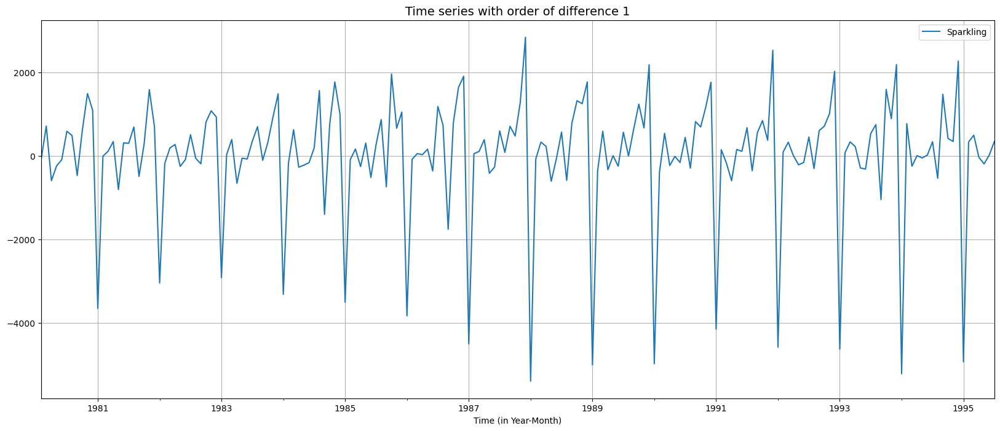

In [108]:
df.diff().dropna().plot(grid=True);
plt.title('Time series with order of difference 1', fontsize=14)
plt.xlabel('Time (in Year-Month)')

### Plot the Autocorrelation and the Partial Autocorrelation function plots on the whole data.

In [109]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

### ACF plot

Text(0, 0.5, 'Correlation')

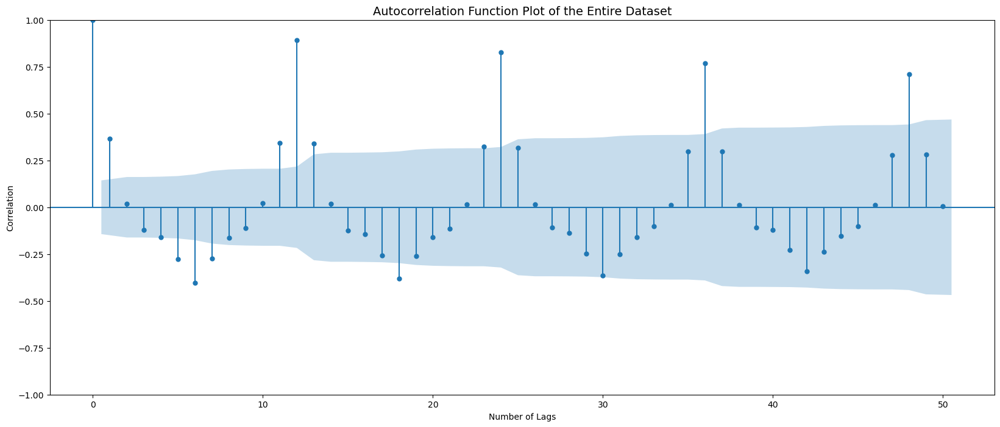

In [110]:
plot_acf(df,alpha=0.05,lags=50);
plt.title('Autocorrelation Function Plot of the Entire Dataset', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

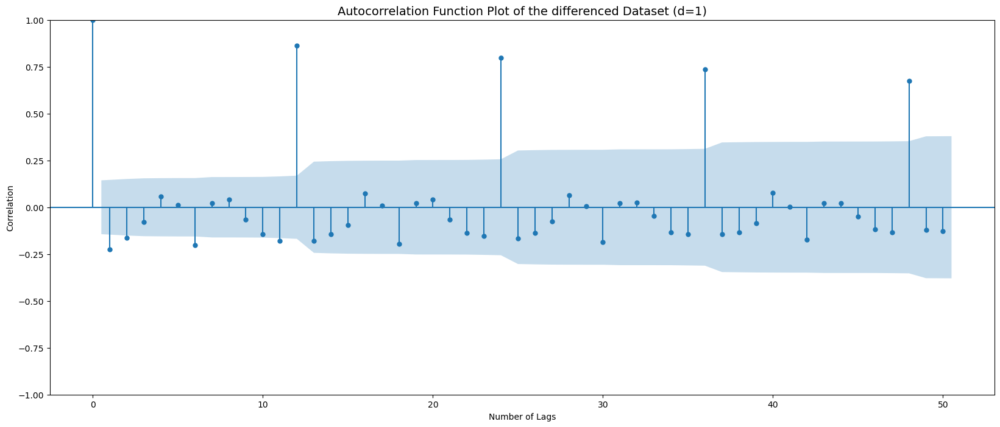

In [111]:
plot_acf(df.diff().dropna(),alpha=0.05,lags=50);
plt.title('Autocorrelation Function Plot of the differenced Dataset (d=1)', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

### PACF plot

Text(0, 0.5, 'Correlation')

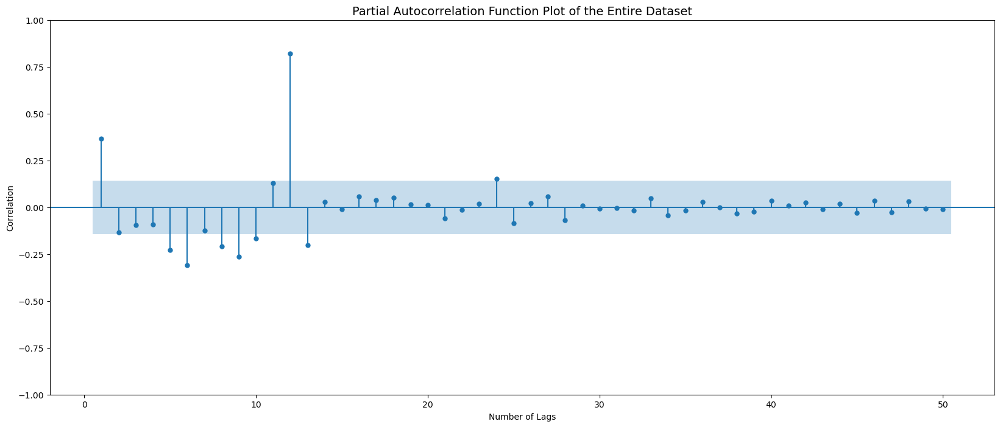

In [112]:
plot_pacf(df,zero=False,alpha=0.05,lags=50, method='ywmle');
plt.title('Partial Autocorrelation Function Plot of the Entire Dataset', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

## Build different ARIMA models

### ARIMA Model

In [113]:
import itertools
p = q = range(0, 5)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Examples of the parameter combinations for the Model')
for i in range(0,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Examples of the parameter combinations for the Model
Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (0, 1, 4)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (1, 1, 4)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (2, 1, 4)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)
Model: (3, 1, 4)
Model: (4, 1, 0)
Model: (4, 1, 1)
Model: (4, 1, 2)
Model: (4, 1, 3)
Model: (4, 1, 4)


In [114]:
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [115]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:# running a loop within the pdq parameters defined by itertools
    ARIMA_model = ARIMA(train['Sparkling'].values,order=param).fit()#fitting the ARIMA model
    #using the parameters from the loop
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))#printing the parameters and the AIC
    #from the fitted models
    ARIMA_AIC = pd.concat(
    [ARIMA_AIC, pd.DataFrame({'param': [param], 'AIC': [ARIMA_model.aic]})],
    ignore_index=True)
    #appending the AIC values and the model parameters to the previously created data frame
    #for easier understanding and sorting of the AIC values

ARIMA(0, 1, 0) - AIC:2232.719438106631
ARIMA(0, 1, 1) - AIC:2217.9392215777407
ARIMA(0, 1, 2) - AIC:2194.0343613616024
ARIMA(0, 1, 3) - AIC:2194.44926713325
ARIMA(0, 1, 4) - AIC:2195.4550039151013
ARIMA(1, 1, 0) - AIC:2231.137663012458
ARIMA(1, 1, 1) - AIC:2196.050085997568
ARIMA(1, 1, 2) - AIC:2194.95965339192
ARIMA(1, 1, 3) - AIC:2195.9392405528833
ARIMA(1, 1, 4) - AIC:2187.961679256672
ARIMA(2, 1, 0) - AIC:2223.899470277437
ARIMA(2, 1, 1) - AIC:2193.9749624358974
ARIMA(2, 1, 2) - AIC:2178.1097234032827


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA(2, 1, 3) - AIC:2193.82417575435


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA(2, 1, 4) - AIC:2183.063752523194
ARIMA(3, 1, 0) - AIC:2220.4600837614917
ARIMA(3, 1, 1) - AIC:2195.740385535868
ARIMA(3, 1, 2) - AIC:2191.627905084249


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA(3, 1, 3) - AIC:2181.617357933246


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA(3, 1, 4) - AIC:2188.8178884114727
ARIMA(4, 1, 0) - AIC:2222.45113022695
ARIMA(4, 1, 1) - AIC:2197.4215382095476


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ARIMA(4, 1, 2) - AIC:2193.526076223401
ARIMA(4, 1, 3) - AIC:2184.8123633684745
ARIMA(4, 1, 4) - AIC:2176.435350844952


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [116]:
ARIMA_AIC.sort_values(by='AIC',ascending=True).head()

,param,AIC
24,"(4, 1, 4)",2176.435351
12,"(2, 1, 2)",2178.109723
18,"(3, 1, 3)",2181.617358
14,"(2, 1, 4)",2183.063753
23,"(4, 1, 3)",2184.812363


In [117]:
auto_ARIMA = ARIMA(train, order=(4,1,4))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  130
Model:                 ARIMA(4, 1, 4)   Log Likelihood               -1079.218
Date:                Sun, 17 Nov 2024   AIC                           2176.435
Time:                        20:23:12   BIC                           2202.174
Sample:                    01-01-1980   HQIC                          2186.893
                         - 10-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4771      0.113     -4.231      0.000      -0.698      -0.256
ar.L2         -0.4781      0.072     -6.604      0.000      -0.620      -0.336
ar.L3         -0.4743      0.095     -4.983      0.0

C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


#### Diagnostics plot

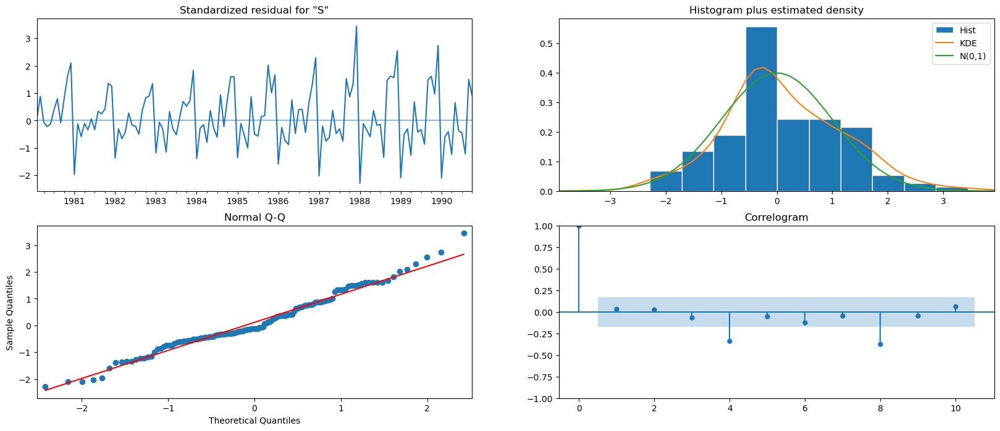

In [118]:
results_auto_ARIMA.plot_diagnostics();

#### Predict on the Test Set using this model and evaluate the model.

In [119]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(test))

In [120]:
predicted_auto_ARIMA

1990-11-01    3214.777567
1990-12-01    3394.965744
1991-01-01    1969.858962
1991-02-01    2030.441267
1991-03-01    2649.035576
1991-04-01    3094.969188
1991-05-01    1813.144764
1991-06-01    1949.810735
1991-07-01    2609.141407
1991-08-01    3070.145987
1991-09-01    1800.427893
1991-10-01    1944.541765
1991-11-01    2608.665745
1991-12-01    3065.954416
1992-01-01    1798.510236
1992-02-01    1944.933551
1992-03-01    2611.135161
1992-04-01    3063.308433
1992-05-01    1797.404376
1992-06-01    1945.759742
1992-07-01    2613.814809
1992-08-01    3060.776929
1992-09-01    1796.361478
1992-10-01    1946.628405
1992-11-01    2616.499630
1992-12-01    3058.252600
1993-01-01    1795.325435
1993-02-01    1947.510104
1993-03-01    2619.174253
1993-04-01    3055.727400
1993-05-01    1794.292080
1993-06-01    1948.402583
1993-07-01    2621.837533
1993-08-01    3053.200729
1993-09-01    1793.261144
1993-10-01    1949.305625
1993-11-01    2624.489389
1993-12-01    3050.672543
1994-01-01  

Text(0, 0.5, 'Wine Units Sold')

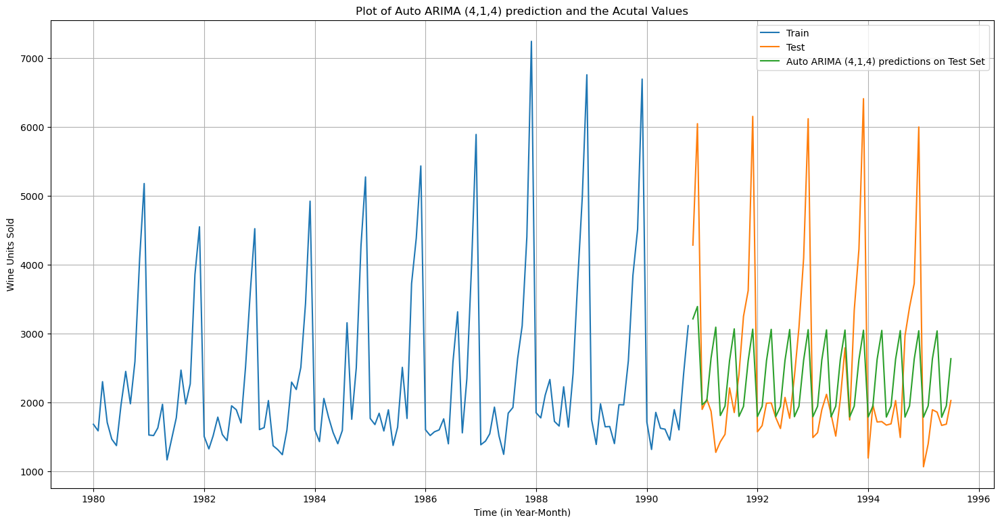

In [121]:
plt.figure(figsize=(18,9))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')

plt.plot(predicted_auto_ARIMA, label='Auto ARIMA (4,1,4) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Auto ARIMA (4,1,4) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [122]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean((np.abs(y_true-y_pred))/(y_true))*100

## Importing the mean_squared_error function from sklearn to calculate the RMSE

from sklearn.metrics import mean_squared_error

In [123]:
rmse = mean_squared_error(test['Sparkling'],predicted_auto_ARIMA,squared=False)
mape = mean_absolute_percentage_error(test['Sparkling'],predicted_auto_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 1213.419548735715 
MAPE: 35.17936281350787


In [124]:
resultsDf_2 = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Auto ARIMA (4,1,4)'])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1213.419549,35.179363


## Manual ARIMA Model

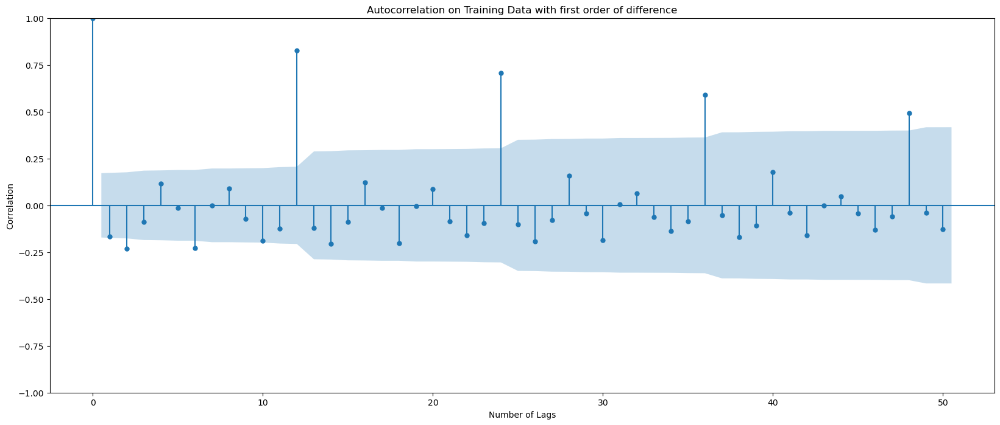

In [125]:
plot_acf(train.diff(),title='Autocorrelation on Training Data with first order of difference',missing='drop',lags=50)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

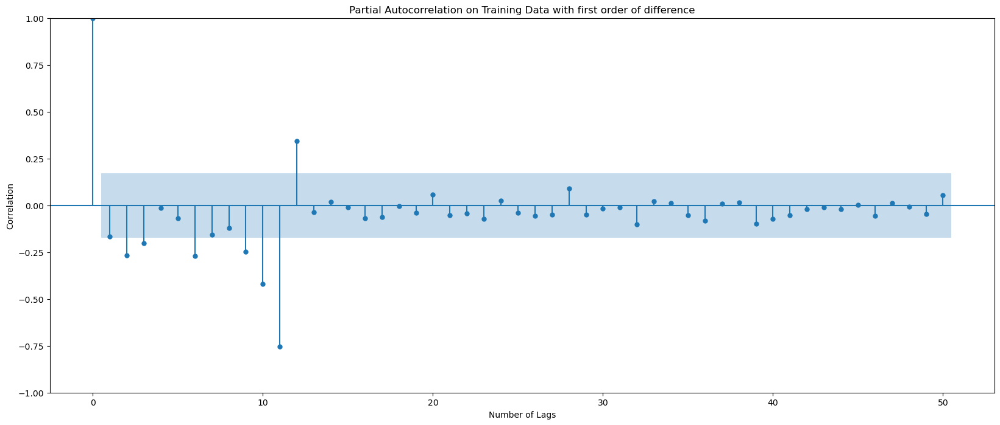

In [126]:
plot_pacf(train.diff().dropna(),title='Partial Autocorrelation on Training Data with first order of difference',lags=50,method='ywmle')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

Here, we have taken alpha=0.05.

The Auto-Regressive parameter in an ARIMA model is 'p' which comes from the significant lag after which the PACF plot cuts-off to 0.

The Moving-Average parameter in an ARIMA model is 'q' which comes from the significant lag after which the ACF plot cuts-off to 0.

By looking at the above plots, we can see that first lag cuts off in both plots and hence we start from lags after lag 0. Therefore we have taken the value of p and q to be 2 and 1 respectively.

We would also build a model with p=0,q=0

In [127]:
manual_ARIMA = ARIMA(train['Sparkling'], order=(0,1,0))

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  130
Model:                 ARIMA(0, 1, 0)   Log Likelihood               -1115.360
Date:                Sun, 17 Nov 2024   AIC                           2232.719
Time:                        20:23:14   BIC                           2235.579
Sample:                    01-01-1980   HQIC                          2233.881
                         - 10-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2       1.88e+06   1.28e+05     14.696      0.000    1.63e+06    2.13e+06
Ljung-Box (L1) (Q):                   3.62   Jarque-Bera (JB):               196.64
Prob(Q):                              0.06   Pr

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


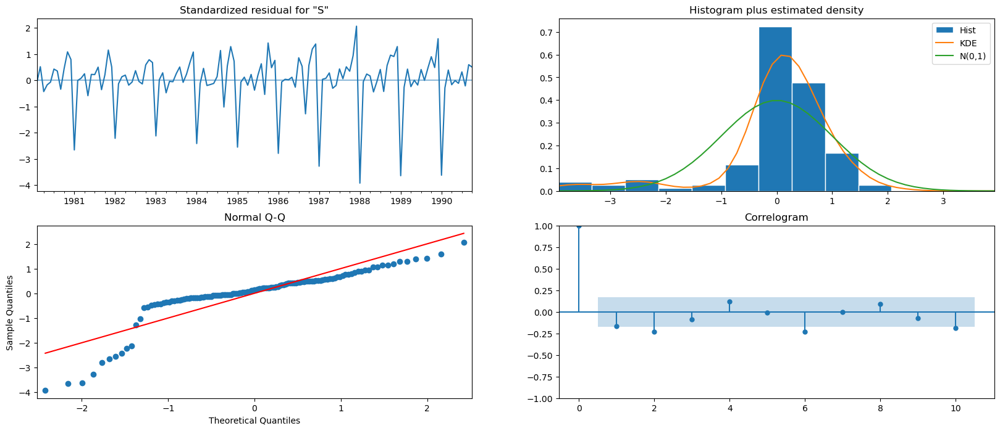

In [128]:
results_manual_ARIMA.plot_diagnostics();

##### Predict on the Test Set using this model and evaluate the model.

In [129]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test))

In [130]:
predicted_manual_ARIMA

1990-11-01    3116.0
1990-12-01    3116.0
1991-01-01    3116.0
1991-02-01    3116.0
1991-03-01    3116.0
1991-04-01    3116.0
1991-05-01    3116.0
1991-06-01    3116.0
1991-07-01    3116.0
1991-08-01    3116.0
1991-09-01    3116.0
1991-10-01    3116.0
1991-11-01    3116.0
1991-12-01    3116.0
1992-01-01    3116.0
1992-02-01    3116.0
1992-03-01    3116.0
1992-04-01    3116.0
1992-05-01    3116.0
1992-06-01    3116.0
1992-07-01    3116.0
1992-08-01    3116.0
1992-09-01    3116.0
1992-10-01    3116.0
1992-11-01    3116.0
1992-12-01    3116.0
1993-01-01    3116.0
1993-02-01    3116.0
1993-03-01    3116.0
1993-04-01    3116.0
1993-05-01    3116.0
1993-06-01    3116.0
1993-07-01    3116.0
1993-08-01    3116.0
1993-09-01    3116.0
1993-10-01    3116.0
1993-11-01    3116.0
1993-12-01    3116.0
1994-01-01    3116.0
1994-02-01    3116.0
1994-03-01    3116.0
1994-04-01    3116.0
1994-05-01    3116.0
1994-06-01    3116.0
1994-07-01    3116.0
1994-08-01    3116.0
1994-09-01    3116.0
1994-10-01   

Text(0, 0.5, 'Wine Units Sold')

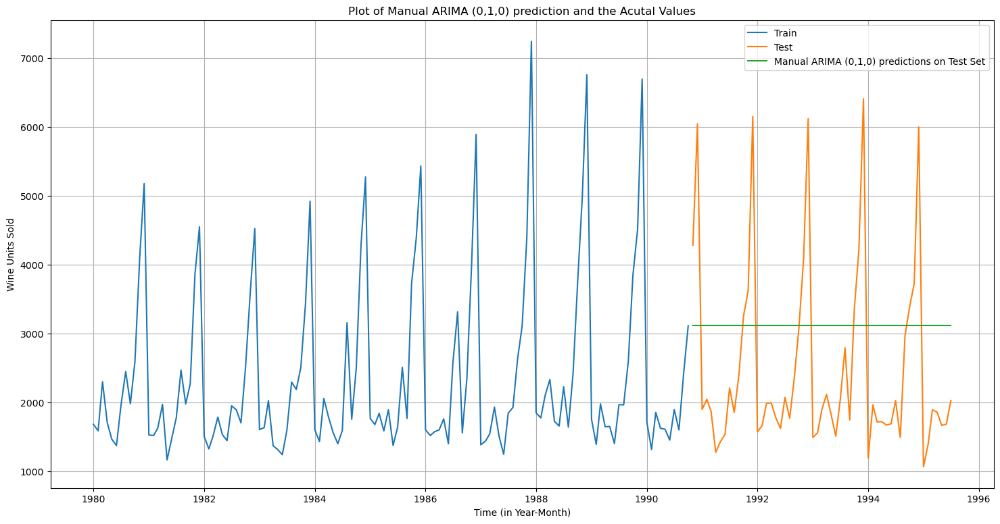

In [131]:
plt.figure(figsize=(18,9))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA (0,1,0) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Manual ARIMA (0,1,0) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [132]:
rmse = mean_squared_error(test['Sparkling'],predicted_manual_ARIMA,squared=False)
mape = mean_absolute_percentage_error(test['Sparkling'],predicted_manual_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 1496.4446285498805 
MAPE: 64.94421166998026


In [133]:
manual_ARIMA = ARIMA(train['Sparkling'], order=(2,1,1))

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  130
Model:                 ARIMA(2, 1, 1)   Log Likelihood               -1092.987
Date:                Sun, 17 Nov 2024   AIC                           2193.975
Time:                        20:23:15   BIC                           2205.414
Sample:                    01-01-1980   HQIC                          2198.623
                         - 10-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4862      0.104      4.660      0.000       0.282       0.691
ar.L2         -0.1764      0.190     -0.929      0.353      -0.548       0.196
ma.L1         -0.9999      0.098    -10.225      0.0

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


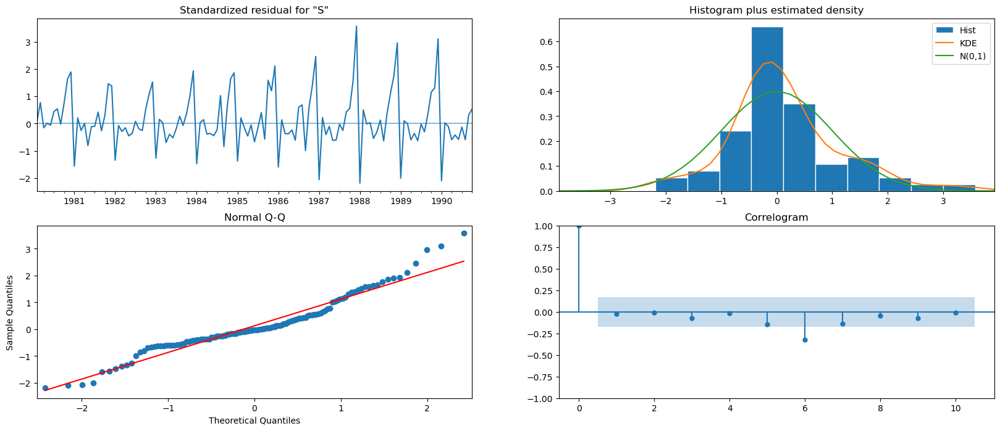

In [134]:
results_manual_ARIMA.plot_diagnostics();

###### Predict on the Test Set using this model and evaluate the model.

In [135]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test))

In [136]:
predicted_manual_ARIMA

1990-11-01    2708.995220
1990-12-01    2389.040709
1991-01-01    2305.252522
1991-02-01    2320.944007
1991-03-01    2343.352124
1991-04-01    2351.480214
1991-05-01    2351.480136
1991-06-01    2350.046490
1991-07-01    2349.349410
1991-08-01    2349.263323
1991-09-01    2349.344414
1991-10-01    2349.399027
1991-11-01    2349.411279
1991-12-01    2349.407605
1992-01-01    2349.403657
1992-02-01    2349.402385
1992-03-01    2349.402463
1992-04-01    2349.402726
1992-05-01    2349.402839
1992-06-01    2349.402848
1992-07-01    2349.402833
1992-08-01    2349.402823
1992-09-01    2349.402822
1992-10-01    2349.402823
1992-11-01    2349.402823
1992-12-01    2349.402823
1993-01-01    2349.402823
1993-02-01    2349.402823
1993-03-01    2349.402823
1993-04-01    2349.402823
1993-05-01    2349.402823
1993-06-01    2349.402823
1993-07-01    2349.402823
1993-08-01    2349.402823
1993-09-01    2349.402823
1993-10-01    2349.402823
1993-11-01    2349.402823
1993-12-01    2349.402823
1994-01-01  

Text(0, 0.5, 'Wine Units Sold')

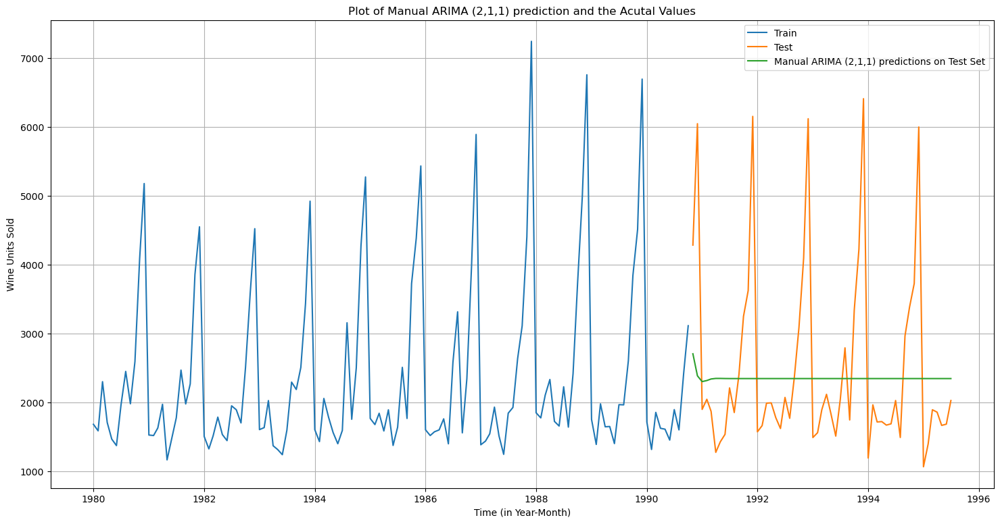

In [137]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA (2,1,1) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Manual ARIMA (2,1,1) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [138]:
rmse = mean_squared_error(test['Sparkling'],predicted_manual_ARIMA,squared=False)
mape = mean_absolute_percentage_error(test['Sparkling'],predicted_manual_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 1359.6498379449822 
MAPE: 37.61924849659625


In [139]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Manual ARIMA (2,1,1)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1213.419549,35.179363
"Manual ARIMA (2,1,1)",1359.649838,37.619248


### Auto SARIMA Model

In [140]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

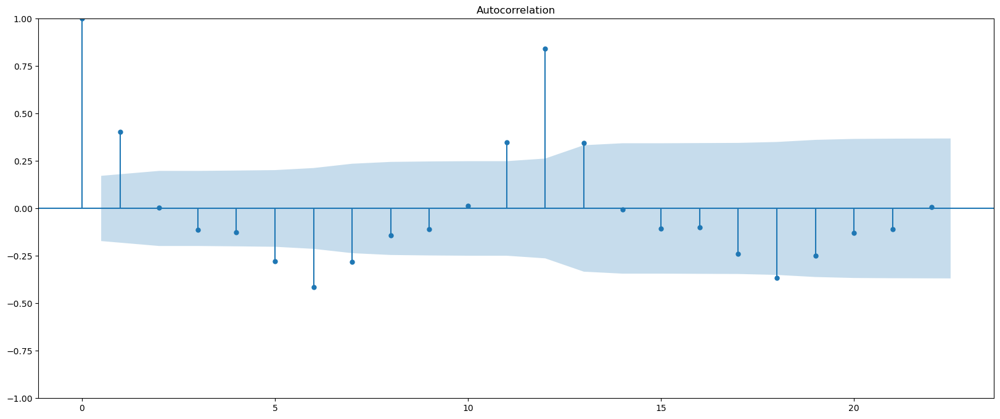

In [141]:
plot_acf(train['Sparkling'],alpha=0.05);

#### <u>SARIMA Model building to estimate best parameters </u>

In [142]:
best_aic = np.inf
best_pdq = None
best_seasonal_pdq = None
temp_model = None

In [143]:
SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC

,param,seasonal,AIC


In [144]:
import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
PDQ = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of the parameter combinations for the Model are')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], PDQ[i]))

Examples of the parameter combinations for the Model are
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (0, 1, 3)(0, 0, 3, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (1, 1, 3)(1, 0, 3, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)
Model: (2, 1, 3)(2, 0, 3, 12)
Model: (3, 1, 0)(3, 0, 0, 12)
Model: (3, 1, 1)(3, 0, 1, 12)
Model: (3, 1, 2)(3, 0, 2, 12)
Model: (3, 1, 3)(3, 0, 3, 12)


In [145]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in PDQ:
        SARIMA_model = sm.tsa.statespace.SARIMAX(train['Sparkling'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMA = SARIMA_model.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA.aic))
        SARIMA_AIC = pd.concat(
    [SARIMA_AIC, pd.DataFrame({'param': [param], 'AIC': [results_SARIMA.aic]})],
    ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:2216.4189020489616
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:1921.5151801496672
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:1691.5049017310646


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(0, 0, 3, 12) - AIC:3316.953797866659
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:1807.2950161665542
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:1777.649291387718
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:1601.2815342104839
SARIMA(0, 1, 0)x(1, 0, 3, 12) - AIC:6553.381639330788
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:1618.9670228363275
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:1617.7268547328765
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:1602.062365958726
SARIMA(0, 1, 0)x(2, 0, 3, 12) - AIC:3624.8693377035615
SARIMA(0, 1, 0)x(3, 0, 0, 12) - AIC:1437.1055194983671
SARIMA(0, 1, 0)x(3, 0, 1, 12) - AIC:1438.820225682501
SARIMA(0, 1, 0)x(3, 0, 2, 12) - AIC:1440.838088055317


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(3, 0, 3, 12) - AIC:3744.401657254942
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:2193.281680181417
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:1888.5868794008134
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:1658.7576059568762


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(0, 0, 3, 12) - AIC:1923.4238017628768
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:1768.1554049142383
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:1704.842734068931
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:1536.319113997995


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(1, 0, 3, 12) - AIC:12.0
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:1575.249693559518
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:1564.914938104801
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:1536.4110102901095


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(2, 0, 3, 12) - AIC:3283.3535878547605
SARIMA(0, 1, 1)x(3, 0, 0, 12) - AIC:1393.2910336832101
SARIMA(0, 1, 1)x(3, 0, 1, 12) - AIC:1392.4034201644665
SARIMA(0, 1, 1)x(3, 0, 2, 12) - AIC:1393.8096828004539


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(3, 0, 3, 12) - AIC:3212.860833800731
SARIMA(0, 1, 2)x(0, 0, 0, 12) - AIC:2143.9209005631083
SARIMA(0, 1, 2)x(0, 0, 1, 12) - AIC:1853.6747164387423
SARIMA(0, 1, 2)x(0, 0, 2, 12) - AIC:1624.7573105529952


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(0, 0, 3, 12) - AIC:5856.3299184294265
SARIMA(0, 1, 2)x(1, 0, 0, 12) - AIC:1760.7216575033112
SARIMA(0, 1, 2)x(1, 0, 1, 12) - AIC:1691.3744541834994
SARIMA(0, 1, 2)x(1, 0, 2, 12) - AIC:1524.5210297965596
SARIMA(0, 1, 2)x(1, 0, 3, 12) - AIC:6750.414110415584
SARIMA(0, 1, 2)x(2, 0, 0, 12) - AIC:1573.2338748413658
SARIMA(0, 1, 2)x(2, 0, 1, 12) - AIC:1566.7494022543365
SARIMA(0, 1, 2)x(2, 0, 2, 12) - AIC:1523.707297278019


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(2, 0, 3, 12) - AIC:3059.639444745491
SARIMA(0, 1, 2)x(3, 0, 0, 12) - AIC:1393.8661778656642
SARIMA(0, 1, 2)x(3, 0, 1, 12) - AIC:1394.0764093431615
SARIMA(0, 1, 2)x(3, 0, 2, 12) - AIC:1395.559032502661


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(3, 0, 3, 12) - AIC:2760.922906911035
SARIMA(0, 1, 3)x(0, 0, 0, 12) - AIC:2128.7427561356603
SARIMA(0, 1, 3)x(0, 0, 1, 12) - AIC:1839.764616715861
SARIMA(0, 1, 3)x(0, 0, 2, 12) - AIC:1610.5977508953104
SARIMA(0, 1, 3)x(0, 0, 3, 12) - AIC:6844.409219986074
SARIMA(0, 1, 3)x(1, 0, 0, 12) - AIC:1762.6628277610453
SARIMA(0, 1, 3)x(1, 0, 1, 12) - AIC:1677.0494312053158
SARIMA(0, 1, 3)x(1, 0, 2, 12) - AIC:1509.0472439861605
SARIMA(0, 1, 3)x(1, 0, 3, 12) - AIC:6667.100335001948
SARIMA(0, 1, 3)x(2, 0, 0, 12) - AIC:1573.913564054748
SARIMA(0, 1, 3)x(2, 0, 1, 12) - AIC:1566.582480927554
SARIMA(0, 1, 3)x(2, 0, 2, 12) - AIC:1509.2134631089787


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(2, 0, 3, 12) - AIC:3645.582873700887
SARIMA(0, 1, 3)x(3, 0, 0, 12) - AIC:1394.5844614675339
SARIMA(0, 1, 3)x(3, 0, 1, 12) - AIC:1394.2223348925688
SARIMA(0, 1, 3)x(3, 0, 2, 12) - AIC:1395.557119105751


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(3, 0, 3, 12) - AIC:3637.8748439477845
SARIMA(1, 1, 0)x(0, 0, 0, 12) - AIC:2214.8516264604455
SARIMA(1, 1, 0)x(0, 0, 1, 12) - AIC:1919.1580486810092
SARIMA(1, 1, 0)x(0, 0, 2, 12) - AIC:1689.8880118556979


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(0, 0, 3, 12) - AIC:3440.9287113339506
SARIMA(1, 1, 0)x(1, 0, 0, 12) - AIC:1782.024250138347
SARIMA(1, 1, 0)x(1, 0, 1, 12) - AIC:1759.3455844990588
SARIMA(1, 1, 0)x(1, 0, 2, 12) - AIC:1587.2527635496897


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(1, 0, 3, 12) - AIC:6856.076319854404
SARIMA(1, 1, 0)x(2, 0, 0, 12) - AIC:1593.015124187761
SARIMA(1, 1, 0)x(2, 0, 1, 12) - AIC:1587.7818267342886
SARIMA(1, 1, 0)x(2, 0, 2, 12) - AIC:1587.0474361857591


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(2, 0, 3, 12) - AIC:3541.4284980907514
SARIMA(1, 1, 0)x(3, 0, 0, 12) - AIC:1410.6370988982485
SARIMA(1, 1, 0)x(3, 0, 1, 12) - AIC:1412.0529228500116
SARIMA(1, 1, 0)x(3, 0, 2, 12) - AIC:1413.7441712186987


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(3, 0, 3, 12) - AIC:3531.653054314054
SARIMA(1, 1, 1)x(0, 0, 0, 12) - AIC:2165.914890109132
SARIMA(1, 1, 1)x(0, 0, 1, 12) - AIC:1872.2057291159754
SARIMA(1, 1, 1)x(0, 0, 2, 12) - AIC:1645.1190352553915


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(0, 0, 3, 12) - AIC:3723.5282433087227
SARIMA(1, 1, 1)x(1, 0, 0, 12) - AIC:1746.0411803412817
SARIMA(1, 1, 1)x(1, 0, 1, 12) - AIC:1706.6940981469634
SARIMA(1, 1, 1)x(1, 0, 2, 12) - AIC:1537.9253341075723


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 0, 3, 12) - AIC:2140.1105458891607
SARIMA(1, 1, 1)x(2, 0, 0, 12) - AIC:1560.2276828197046
SARIMA(1, 1, 1)x(2, 0, 1, 12) - AIC:1552.24039416063
SARIMA(1, 1, 1)x(2, 0, 2, 12) - AIC:1538.047236069403


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(2, 0, 3, 12) - AIC:3092.0245946773775
SARIMA(1, 1, 1)x(3, 0, 0, 12) - AIC:1379.8403265932582
SARIMA(1, 1, 1)x(3, 0, 1, 12) - AIC:1380.023934513835
SARIMA(1, 1, 1)x(3, 0, 2, 12) - AIC:1381.587979314265


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(3, 0, 3, 12) - AIC:3601.0017687170557
SARIMA(1, 1, 2)x(0, 0, 0, 12) - AIC:2145.096976592647
SARIMA(1, 1, 2)x(0, 0, 1, 12) - AIC:1855.540990154338
SARIMA(1, 1, 2)x(0, 0, 2, 12) - AIC:1626.606822934601


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(0, 0, 3, 12) - AIC:2188.9892772425787
SARIMA(1, 1, 2)x(1, 0, 0, 12) - AIC:1741.9397078410248
SARIMA(1, 1, 2)x(1, 0, 1, 12) - AIC:1690.7620851254474
SARIMA(1, 1, 2)x(1, 0, 2, 12) - AIC:1521.9494826740092
SARIMA(1, 1, 2)x(1, 0, 3, 12) - AIC:6752.369668395222
SARIMA(1, 1, 2)x(2, 0, 0, 12) - AIC:1557.630288080571
SARIMA(1, 1, 2)x(2, 0, 1, 12) - AIC:1551.391406793658
SARIMA(1, 1, 2)x(2, 0, 2, 12) - AIC:1521.7301125566823


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(2, 0, 3, 12) - AIC:3474.8646916022644
SARIMA(1, 1, 2)x(3, 0, 0, 12) - AIC:1381.8485519832057
SARIMA(1, 1, 2)x(3, 0, 1, 12) - AIC:1382.0297639466196
SARIMA(1, 1, 2)x(3, 0, 2, 12) - AIC:1380.5372077369166


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(3, 0, 3, 12) - AIC:3429.824278132895
SARIMA(1, 1, 3)x(0, 0, 0, 12) - AIC:2131.771220565303
SARIMA(1, 1, 3)x(0, 0, 1, 12) - AIC:1841.590283696155
SARIMA(1, 1, 3)x(0, 0, 2, 12) - AIC:1608.8236055726582


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(0, 0, 3, 12) - AIC:2081.923561337872
SARIMA(1, 1, 3)x(1, 0, 0, 12) - AIC:1743.9688138217039
SARIMA(1, 1, 3)x(1, 0, 1, 12) - AIC:1678.4001546362044
SARIMA(1, 1, 3)x(1, 0, 2, 12) - AIC:1508.6795578473307
SARIMA(1, 1, 3)x(1, 0, 3, 12) - AIC:6668.909561391936
SARIMA(1, 1, 3)x(2, 0, 0, 12) - AIC:1559.6106093582887
SARIMA(1, 1, 3)x(2, 0, 1, 12) - AIC:1552.7909385308358
SARIMA(1, 1, 3)x(2, 0, 2, 12) - AIC:1508.9281649976801


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(2, 0, 3, 12) - AIC:2991.268750312356
SARIMA(1, 1, 3)x(3, 0, 0, 12) - AIC:1380.4873079170666
SARIMA(1, 1, 3)x(3, 0, 1, 12) - AIC:1380.3409652322916
SARIMA(1, 1, 3)x(3, 0, 2, 12) - AIC:1381.8182157635163


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(3, 0, 3, 12) - AIC:3342.8998225829027
SARIMA(2, 1, 0)x(0, 0, 0, 12) - AIC:2190.8338694577515
SARIMA(2, 1, 0)x(0, 0, 1, 12) - AIC:1913.1070230455482
SARIMA(2, 1, 0)x(0, 0, 2, 12) - AIC:1678.651097132928


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(0, 0, 3, 12) - AIC:4043.5856050074785
SARIMA(2, 1, 0)x(1, 0, 0, 12) - AIC:1751.4274988003995
SARIMA(2, 1, 0)x(1, 0, 1, 12) - AIC:1726.338133900065
SARIMA(2, 1, 0)x(1, 0, 2, 12) - AIC:1570.2465435846966
SARIMA(2, 1, 0)x(1, 0, 3, 12) - AIC:6898.579908039022
SARIMA(2, 1, 0)x(2, 0, 0, 12) - AIC:1563.2068573875492
SARIMA(2, 1, 0)x(2, 0, 1, 12) - AIC:1556.407845018931
SARIMA(2, 1, 0)x(2, 0, 2, 12) - AIC:1554.9512534106434
SARIMA(2, 1, 0)x(2, 0, 3, 12) - AIC:3628.869337702033
SARIMA(2, 1, 0)x(3, 0, 0, 12) - AIC:1380.4730083925958
SARIMA(2, 1, 0)x(3, 0, 1, 12) - AIC:1380.6262856563021
SARIMA(2, 1, 0)x(3, 0, 2, 12) - AIC:1381.8892454228771


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(3, 0, 3, 12) - AIC:3103.8337830334713
SARIMA(2, 1, 1)x(0, 0, 0, 12) - AIC:2160.2483044779
SARIMA(2, 1, 1)x(0, 0, 1, 12) - AIC:1870.9922931385638
SARIMA(2, 1, 1)x(0, 0, 2, 12) - AIC:1642.517668353798


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(0, 0, 3, 12) - AIC:7018.726972252426
SARIMA(2, 1, 1)x(1, 0, 0, 12) - AIC:1730.2218368538113
SARIMA(2, 1, 1)x(1, 0, 1, 12) - AIC:1706.7535527206414
SARIMA(2, 1, 1)x(1, 0, 2, 12) - AIC:1538.345097317386
SARIMA(2, 1, 1)x(1, 0, 3, 12) - AIC:6823.234064332932
SARIMA(2, 1, 1)x(2, 0, 0, 12) - AIC:1546.7290693790144
SARIMA(2, 1, 1)x(2, 0, 1, 12) - AIC:1538.7173769079586
SARIMA(2, 1, 1)x(2, 0, 2, 12) - AIC:1538.265706603269
SARIMA(2, 1, 1)x(2, 0, 3, 12) - AIC:3591.5990188200462
SARIMA(2, 1, 1)x(3, 0, 0, 12) - AIC:1367.448213208246
SARIMA(2, 1, 1)x(3, 0, 1, 12) - AIC:1367.0874629287775
SARIMA(2, 1, 1)x(3, 0, 2, 12) - AIC:1368.4868594486738
SARIMA(2, 1, 1)x(3, 0, 3, 12) - AIC:3581.9738489991614
SARIMA(2, 1, 2)x(0, 0, 0, 12) - AIC:2140.669395961772
SARIMA(2, 1, 2)x(0, 0, 1, 12) - AIC:1857.4627139746094
SARIMA(2, 1, 2)x(0, 0, 2, 12) - AIC:1631.3963033844175
SARIMA(2, 1, 2)x(0, 0, 3, 12) - AIC:16.0
SARIMA(2, 1, 2)x(1, 0, 0, 12) - AIC:1727.5761548778864
SARIMA(2, 1, 2)x(1, 0, 1, 12) 

C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 0, 3, 12) - AIC:2828.4617081389665
SARIMA(2, 1, 2)x(3, 0, 0, 12) - AIC:1386.5775959124596
SARIMA(2, 1, 2)x(3, 0, 1, 12) - AIC:1365.9992511584967
SARIMA(2, 1, 2)x(3, 0, 2, 12) - AIC:1367.4328647908364


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(3, 0, 3, 12) - AIC:2111.463889197414
SARIMA(2, 1, 3)x(0, 0, 0, 12) - AIC:2124.606145281952
SARIMA(2, 1, 3)x(0, 0, 1, 12) - AIC:1830.7463347625976
SARIMA(2, 1, 3)x(0, 0, 2, 12) - AIC:1606.794925691532


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(0, 0, 3, 12) - AIC:4145.074732128492
SARIMA(2, 1, 3)x(1, 0, 0, 12) - AIC:1728.5036136591657
SARIMA(2, 1, 3)x(1, 0, 1, 12) - AIC:1672.752013312839
SARIMA(2, 1, 3)x(1, 0, 2, 12) - AIC:1507.7588821229676


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(1, 0, 3, 12) - AIC:95.00363541032739
SARIMA(2, 1, 3)x(2, 0, 0, 12) - AIC:1547.2068566952184
SARIMA(2, 1, 3)x(2, 0, 1, 12) - AIC:1540.97904443564
SARIMA(2, 1, 3)x(2, 0, 2, 12) - AIC:1508.7574105686765


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(2, 0, 3, 12) - AIC:3244.034251209652
SARIMA(2, 1, 3)x(3, 0, 0, 12) - AIC:1370.8870816373676
SARIMA(2, 1, 3)x(3, 0, 1, 12) - AIC:1372.3156453876259
SARIMA(2, 1, 3)x(3, 0, 2, 12) - AIC:1371.7126983239057


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(3, 0, 3, 12) - AIC:3142.8281914150357
SARIMA(3, 1, 0)x(0, 0, 0, 12) - AIC:2171.1688749300806
SARIMA(3, 1, 0)x(0, 0, 1, 12) - AIC:1912.3469876261488
SARIMA(3, 1, 0)x(0, 0, 2, 12) - AIC:1676.0755082767062
SARIMA(3, 1, 0)x(0, 0, 3, 12) - AIC:4306.93833049893
SARIMA(3, 1, 0)x(1, 0, 0, 12) - AIC:1733.7342125396901
SARIMA(3, 1, 0)x(1, 0, 1, 12) - AIC:1709.4957074087924
SARIMA(3, 1, 0)x(1, 0, 2, 12) - AIC:1569.3975851344705


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(1, 0, 3, 12) - AIC:4722.845613616429
SARIMA(3, 1, 0)x(2, 0, 0, 12) - AIC:1549.1373218272938
SARIMA(3, 1, 0)x(2, 0, 1, 12) - AIC:1541.4807356793806
SARIMA(3, 1, 0)x(2, 0, 2, 12) - AIC:1540.5134779763175


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(2, 0, 3, 12) - AIC:3320.7390148065742
SARIMA(3, 1, 0)x(3, 0, 0, 12) - AIC:1365.2642128027053
SARIMA(3, 1, 0)x(3, 0, 1, 12) - AIC:1365.0585514236461
SARIMA(3, 1, 0)x(3, 0, 2, 12) - AIC:1365.983545353655


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(3, 0, 3, 12) - AIC:3154.628155626114
SARIMA(3, 1, 1)x(0, 0, 0, 12) - AIC:2145.8297241801406
SARIMA(3, 1, 1)x(0, 0, 1, 12) - AIC:1872.9554872276624
SARIMA(3, 1, 1)x(0, 0, 2, 12) - AIC:1644.4917906743017


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(0, 0, 3, 12) - AIC:6620.855373842935
SARIMA(3, 1, 1)x(1, 0, 0, 12) - AIC:1716.7765080103507
SARIMA(3, 1, 1)x(1, 0, 1, 12) - AIC:1693.798430576701
SARIMA(3, 1, 1)x(1, 0, 2, 12) - AIC:1539.7997633310288
SARIMA(3, 1, 1)x(1, 0, 3, 12) - AIC:6825.234099631989
SARIMA(3, 1, 1)x(2, 0, 0, 12) - AIC:1534.1840459050486
SARIMA(3, 1, 1)x(2, 0, 1, 12) - AIC:1526.4129846276307
SARIMA(3, 1, 1)x(2, 0, 2, 12) - AIC:1527.950609427387
SARIMA(3, 1, 1)x(2, 0, 3, 12) - AIC:3593.5990188194137
SARIMA(3, 1, 1)x(3, 0, 0, 12) - AIC:1352.6680510935225
SARIMA(3, 1, 1)x(3, 0, 1, 12) - AIC:1352.5069622960546
SARIMA(3, 1, 1)x(3, 0, 2, 12) - AIC:1353.7130900093878


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(3, 0, 3, 12) - AIC:2706.9934548162532
SARIMA(3, 1, 2)x(0, 0, 0, 12) - AIC:2148.8206559984533
SARIMA(3, 1, 2)x(0, 0, 1, 12) - AIC:1853.4370531107256
SARIMA(3, 1, 2)x(0, 0, 2, 12) - AIC:1626.7393038583664


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(0, 0, 3, 12) - AIC:6261.126437434779
SARIMA(3, 1, 2)x(1, 0, 0, 12) - AIC:1715.2509861621445
SARIMA(3, 1, 2)x(1, 0, 1, 12) - AIC:1693.8672588438633
SARIMA(3, 1, 2)x(1, 0, 2, 12) - AIC:1525.3998793379649
SARIMA(3, 1, 2)x(1, 0, 3, 12) - AIC:6754.195316336269
SARIMA(3, 1, 2)x(2, 0, 0, 12) - AIC:1533.4714985364583
SARIMA(3, 1, 2)x(2, 0, 1, 12) - AIC:1526.089659328466
SARIMA(3, 1, 2)x(2, 0, 2, 12) - AIC:1528.0493871174363


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(2, 0, 3, 12) - AIC:3412.2696258397095
SARIMA(3, 1, 2)x(3, 0, 0, 12) - AIC:1354.6775924138146
SARIMA(3, 1, 2)x(3, 0, 1, 12) - AIC:1352.34917155085
SARIMA(3, 1, 2)x(3, 0, 2, 12) - AIC:1378.0267432182607


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(3, 0, 3, 12) - AIC:3778.507016953756
SARIMA(3, 1, 3)x(0, 0, 0, 12) - AIC:2116.8673496971956
SARIMA(3, 1, 3)x(0, 0, 1, 12) - AIC:1839.4489024137476
SARIMA(3, 1, 3)x(0, 0, 2, 12) - AIC:1614.399417623657


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(0, 0, 3, 12) - AIC:20.0
SARIMA(3, 1, 3)x(1, 0, 0, 12) - AIC:1712.5930606568052
SARIMA(3, 1, 3)x(1, 0, 1, 12) - AIC:1674.419643497917
SARIMA(3, 1, 3)x(1, 0, 2, 12) - AIC:1509.5978983700356
SARIMA(3, 1, 3)x(1, 0, 3, 12) - AIC:6666.299893750108
SARIMA(3, 1, 3)x(2, 0, 0, 12) - AIC:1535.1443524224906
SARIMA(3, 1, 3)x(2, 0, 1, 12) - AIC:1529.8526577160794
SARIMA(3, 1, 3)x(2, 0, 2, 12) - AIC:1519.07465068552


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(2, 0, 3, 12) - AIC:3440.6196804039428
SARIMA(3, 1, 3)x(3, 0, 0, 12) - AIC:1353.9229247021774
SARIMA(3, 1, 3)x(3, 0, 1, 12) - AIC:1349.7054236762292
SARIMA(3, 1, 3)x(3, 0, 2, 12) - AIC:1360.9492601832428
SARIMA(3, 1, 3)x(3, 0, 3, 12) - AIC:3393.401130045434


C:\ANACONDA\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [146]:
SARIMA_AIC.sort_values(by=['AIC']).head(20)

,param,seasonal,AIC
23,"(0, 1, 1)",NaN,12.000000
163,"(2, 1, 2)",NaN,16.000000
167,"(2, 1, 2)",NaN,18.000000
243,"(3, 1, 3)",NaN,20.000000
183,"(2, 1, 3)",NaN,95.003635
253,"(3, 1, 3)",NaN,1349.705424
237,"(3, 1, 2)",NaN,1352.349172
221,"(3, 1, 1)",NaN,1352.506962
220,"(3, 1, 1)",NaN,1352.668051
222,"(3, 1, 1)",NaN,1353.713090


In [147]:
import statsmodels.api as sm

auto_SARIMA = sm.tsa.statespace.SARIMAX(train['Sparkling'],
                                order=(3, 1, 3),
                                seasonal_order=(3, 0, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA = auto_SARIMA.fit(maxiter=1000)
print(results_auto_SARIMA.summary())

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


                                      SARIMAX Results                                       
Dep. Variable:                            Sparkling   No. Observations:                  130
Model:             SARIMAX(3, 1, 3)x(3, 0, [1], 12)   Log Likelihood                -663.853
Date:                              Sun, 17 Nov 2024   AIC                           1349.705
Time:                                      20:29:00   BIC                           1377.203
Sample:                                  01-01-1980   HQIC                          1360.794
                                       - 10-01-1990                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.8059      0.124    -14.589      0.000      -2.048      -1.563
ar.L2         -1.00

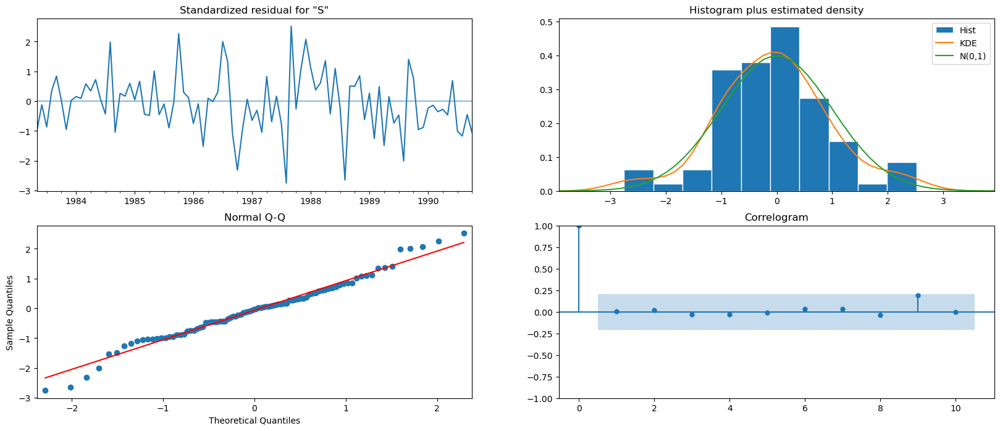

In [148]:
results_auto_SARIMA.plot_diagnostics();
plt.show()

#### Predict on the Test Set using this model and evaluate the model.

In [149]:
predicted_auto_SARIMA = results_auto_SARIMA.get_forecast(steps=len(test))

In [150]:
predicted_auto_SARIMA.predicted_mean

1990-11-01    4905.688080
1990-12-01    7520.962785
1991-01-01    1568.403256
1991-02-01    1442.448057
1991-03-01    1831.546412
1991-04-01    1846.713801
1991-05-01    1573.422605
1991-06-01    1339.842203
1991-07-01    2031.517645
1991-08-01    1862.698465
1991-09-01    2455.247355
1991-10-01    3608.647029
1991-11-01    5213.407557
1991-12-01    7811.425490
1992-01-01    1608.365669
1992-02-01    1334.937985
1992-03-01    1860.987618
1992-04-01    1758.323292
1992-05-01    1546.217882
1992-06-01    1286.084026
1992-07-01    2004.396190
1992-08-01    1862.451159
1992-09-01    2527.769047
1992-10-01    3812.802189
1992-11-01    5343.189107
1992-12-01    8109.119098
1993-01-01    1584.433762
1993-02-01    1261.780686
1993-03-01    1835.287333
1993-04-01    1697.618293
1993-05-01    1508.831061
1993-06-01    1251.619567
1993-07-01    1970.281272
1993-08-01    1776.137525
1993-09-01    2544.636676
1993-10-01    3807.586950
1993-11-01    5562.130551
1993-12-01    8568.196651
1994-01-01  

Text(0, 0.5, 'Wine Units Sold')

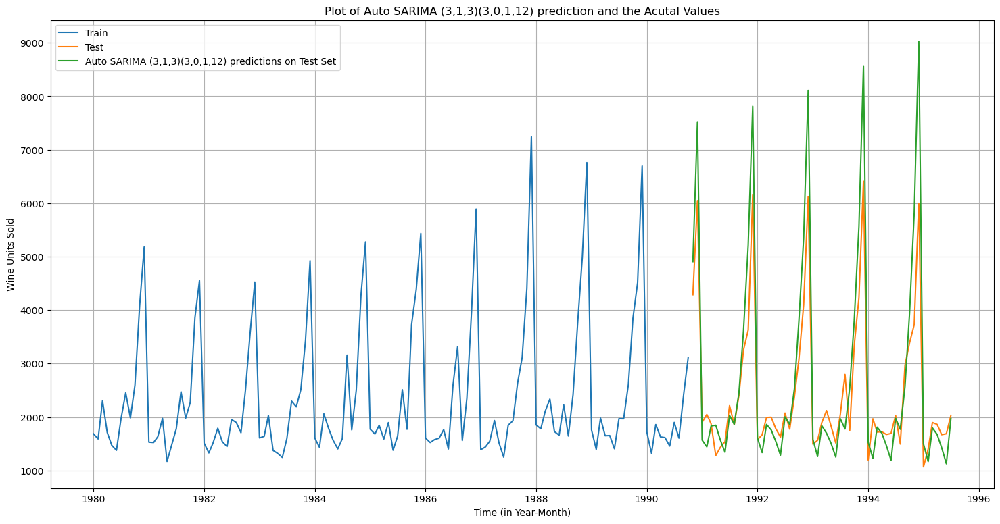

In [151]:
plt.figure(figsize=(18,9))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')

plt.plot(predicted_auto_SARIMA.predicted_mean, label='Auto SARIMA (3,1,3)(3,0,1,12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Auto SARIMA (3,1,3)(3,0,1,12) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [152]:
predicted_auto_SARIMA.summary_frame(alpha=0.05).head()

Sparkling,mean,mean_se,mean_ci_lower,mean_ci_upper
1990-11-01,4905.688080,370.488641,4179.543687,5631.832473
1990-12-01,7520.962785,378.007149,6780.082386,8261.843184
1991-01-01,1568.403256,385.196422,813.432143,2323.374370
1991-02-01,1442.448057,396.626577,665.074251,2219.821863
1991-03-01,1831.546412,396.793958,1053.844545,2609.248280


In [153]:
rmse = mean_squared_error(test['Sparkling'],predicted_auto_SARIMA.predicted_mean,squared=False)
mape = mean_absolute_percentage_error(test['Sparkling'],predicted_auto_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 835.4697748560455 
MAPE: 18.70777880972156


In [154]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Auto SARIMA (3,1,2)(3,0,1,12)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2


,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1213.419549,35.179363
"Manual ARIMA (2,1,1)",1359.649838,37.619248
"Auto SARIMA (3,1,2)(3,0,1,12)",835.469775,18.707779


## Manual SARIMA Model

Let us look at the ACF and the PACF plots once more.

### ACF plot

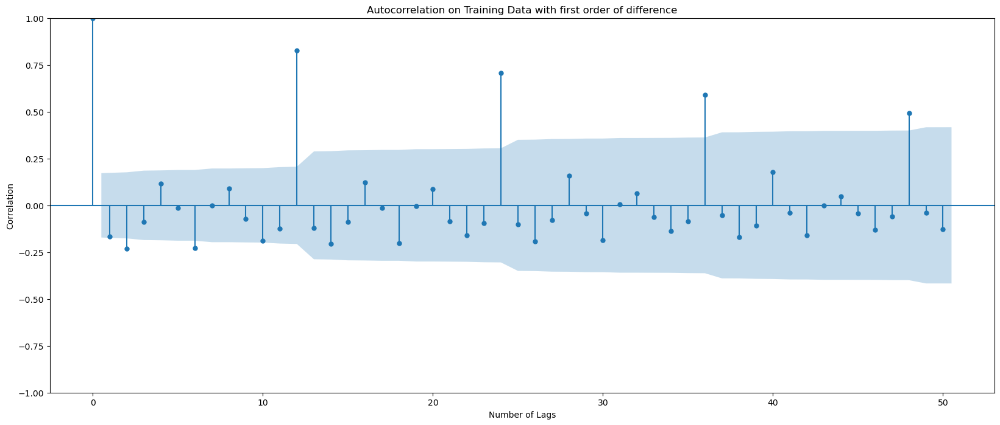

In [155]:
plot_acf(train.diff(),title='Autocorrelation on Training Data with first order of difference',missing='drop',lags=50)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

### PACF plot

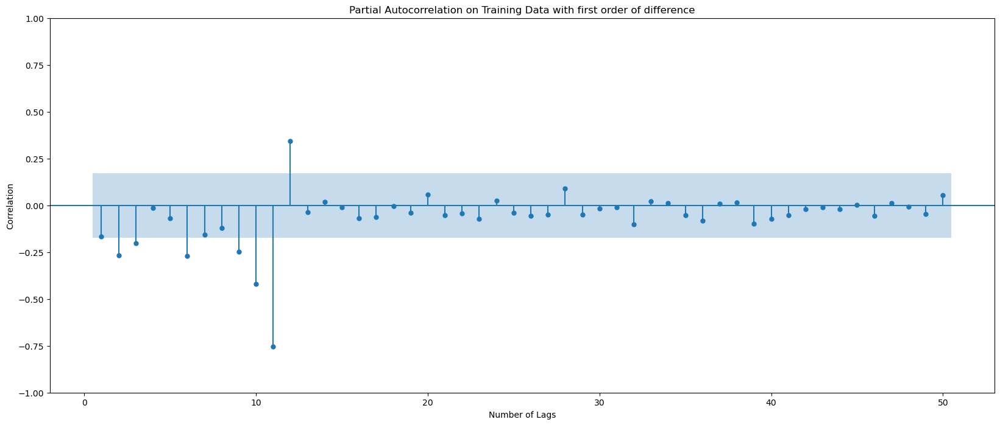

In [156]:
plot_pacf(train.diff().dropna(),title='Partial Autocorrelation on Training Data with first order of difference',lags=50,zero=False,method='ywmle')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

We see that our ACF plot at the seasonal interval (12) does not taper off quickly. So, we go ahead and take a seasonal differencing of the original series. Before that let us look at the original series.

Text(0, 0.5, 'Units Sold')

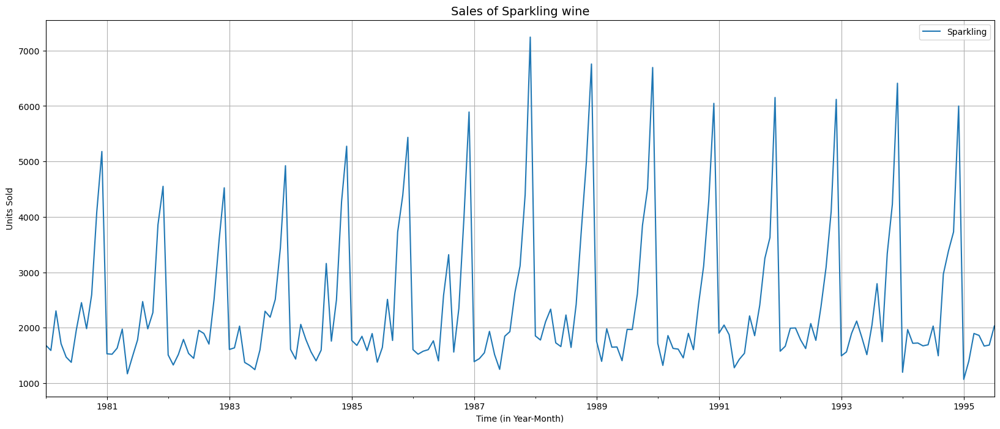

In [157]:
#Original Time Series
rcParams['figure.figsize'] = 20,8
df.plot(grid=True);
plt.title('Sales of Sparkling wine', fontsize=14)
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Units Sold',fontsize=10)

Text(0, 0.5, 'Wine Units Sold')

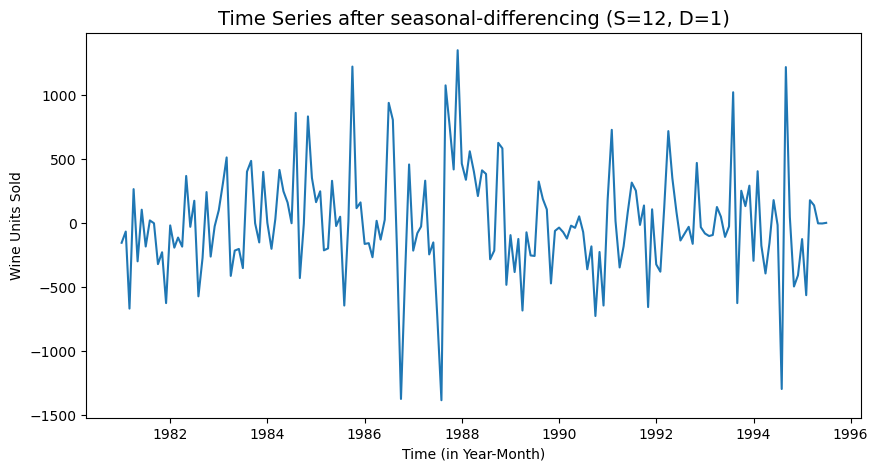

In [158]:
#Time series with seasonal differencing (S=12, D=1)
plt.figure(figsize=(10,5))
plt.plot(df['Sparkling'].diff(12).dropna())
plt.title ('Time Series after seasonal-differencing (S=12, D=1)',fontsize=14);
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Wine Units Sold',fontsize=10)

Text(0, 0.5, 'Wine Units Sold')

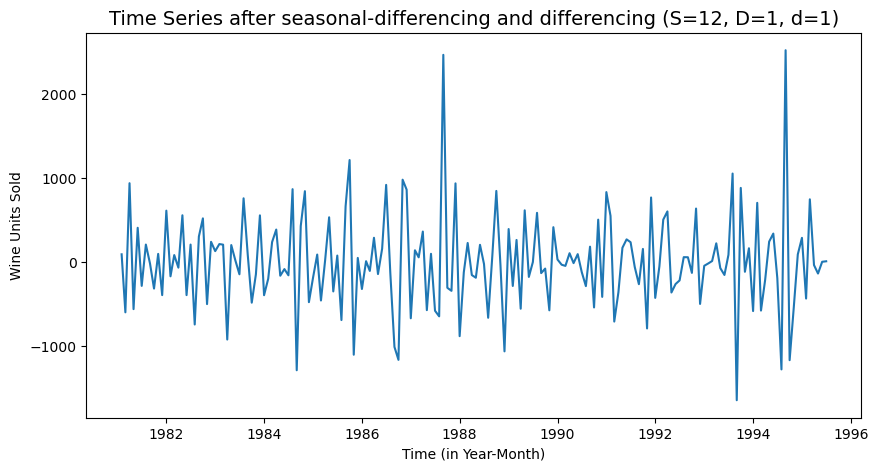

In [159]:
plt.figure(figsize=(10,5))
plt.plot((df['Sparkling'].diff(12).dropna()).diff().dropna())
plt.title ('Time Series after seasonal-differencing and differencing (S=12, D=1, d=1)',fontsize=14);
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Wine Units Sold',fontsize=10)

In [160]:
#Testing stationarity
dftest = adfuller((df['Sparkling'].diff(12).dropna()).diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -5.121
DF test p-value is 0.00012316304915681252
Number of lags used 11


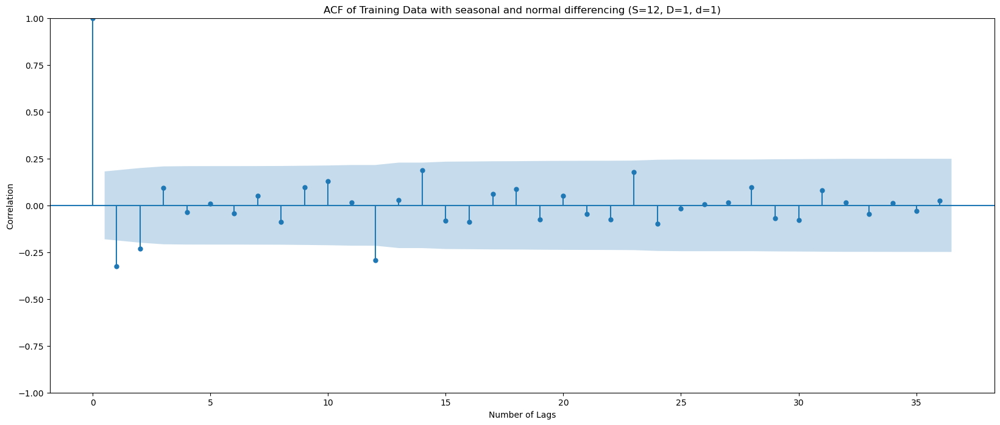

In [161]:
plot_acf((train['Sparkling'].diff(12).dropna()).diff().dropna(),title='ACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=36)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

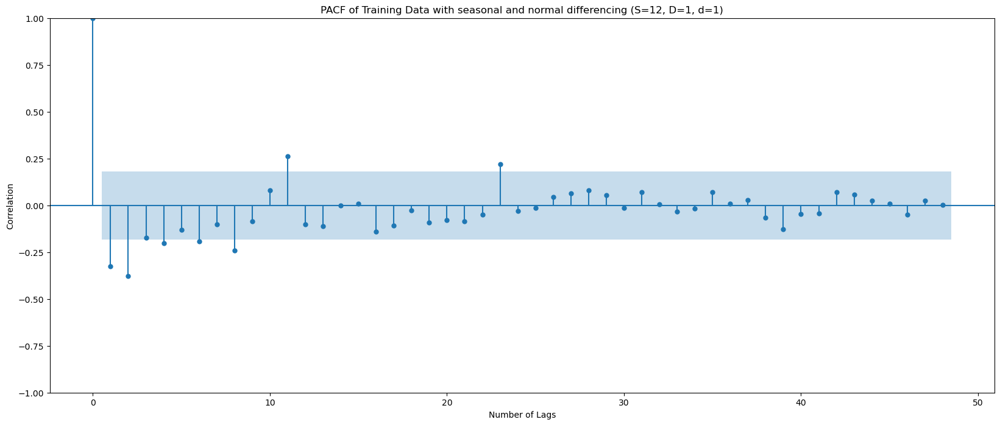

In [162]:
plot_pacf((train['Sparkling'].diff(12).dropna()).diff().dropna(),title='PACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=48)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

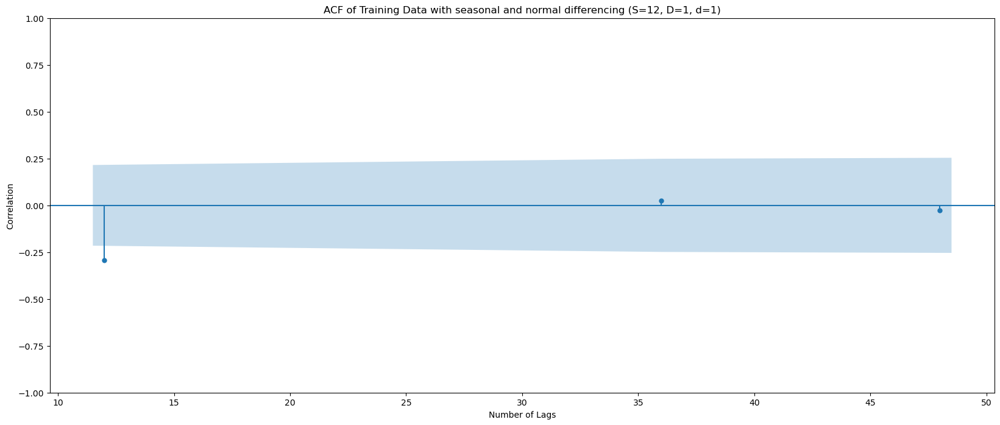

In [163]:
plot_acf((train['Sparkling'].diff(12).dropna()).diff().dropna(),title='ACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=[12.24,36,48])
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

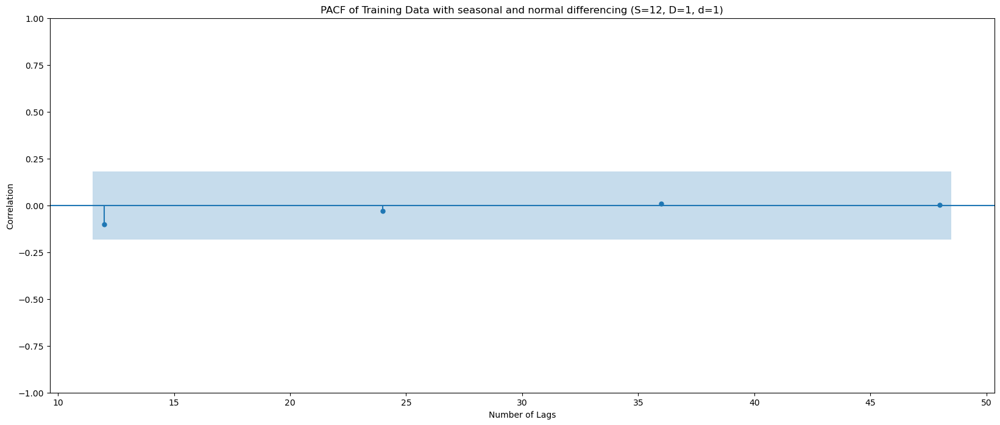

In [164]:
plot_pacf((train['Sparkling'].diff(12).dropna()).diff().dropna(),title='PACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=[12,24,36,48])
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

Here we have taken alpha = 0.05 and seasonal period as 12.

From the PACF plot it can be seen that till lag 4 is significant before cut-off, so AR term ‘p = 4’ is chosen. At seasonal lag of 12, it cuts off, so keep seasonal AR ‘P = 0’.

From ACF plot, lag 1 and 2 are significant before it cuts off, so lets keep MA term ‘q = 2’ and at seasonal lag of 12, a significant lag is apparent and no seaonal lags are apparent at lags 24, 36 or afterwards, so lets keep ‘Q = 1'.

The final selected terms for SARIMA model is (4, 1, 2)x(0, 1, 1, 12), as inferred from the ACF and PACF plots.

In [165]:
import statsmodels.api as sm

manual_SARIMA = sm.tsa.statespace.SARIMAX(train['Sparkling'],
                                order=(4,1,2),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA = manual_SARIMA.fit(maxiter=1000)
print(results_manual_SARIMA.summary())

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


                                      SARIMAX Results                                       
Dep. Variable:                            Sparkling   No. Observations:                  130
Model:             SARIMAX(4, 1, 2)x(0, 1, [1], 12)   Log Likelihood                -756.432
Date:                              Sun, 17 Nov 2024   AIC                           1528.864
Time:                                      20:29:03   BIC                           1549.864
Sample:                                  01-01-1980   HQIC                          1537.367
                                       - 10-01-1990                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2161      0.527     -0.410      0.681      -1.248       0.816
ar.L2         -0.07

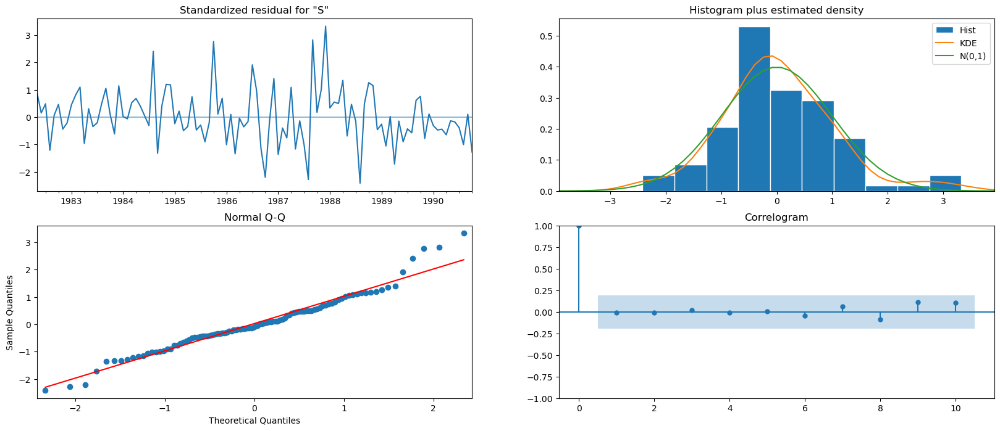

In [166]:
results_manual_SARIMA.plot_diagnostics()
plt.show()

#### Predict on the Test Set using this model and evaluate the model.

In [167]:
predicted_manual_SARIMA = results_manual_SARIMA.get_forecast(steps=len(test))

In [168]:
predicted_manual_SARIMA.predicted_mean

1990-11-01    4410.231355
1990-12-01    6690.699268
1991-01-01    1621.657141
1991-02-01    1405.413679
1991-03-01    1828.835228
1991-04-01    1637.726168
1991-05-01    1577.808957
1991-06-01    1370.707791
1991-07-01    1893.666161
1991-08-01    1719.626980
1991-09-01    2370.054235
1991-10-01    3281.990488
1991-11-01    4415.449563
1991-12-01    6602.680837
1992-01-01    1598.461037
1992-02-01    1336.070101
1992-03-01    1788.487855
1992-04-01    1611.254445
1992-05-01    1534.548105
1992-06-01    1338.150088
1992-07-01    1855.690798
1992-08-01    1679.369553
1992-09-01    2333.672710
1992-10-01    3243.087731
1992-11-01    4377.621831
1992-12-01    6565.272211
1993-01-01    1560.193300
1993-02-01    1298.389222
1993-03-01    1750.581120
1993-04-01    1573.264052
1993-05-01    1496.745813
1993-06-01    1300.213238
1993-07-01    1817.803346
1993-08-01    1641.499581
1993-09-01    2295.761602
1993-10-01    3205.207121
1993-11-01    4339.730168
1993-12-01    6527.376829
1994-01-01  

Text(0, 0.5, 'Wine Units Sold')

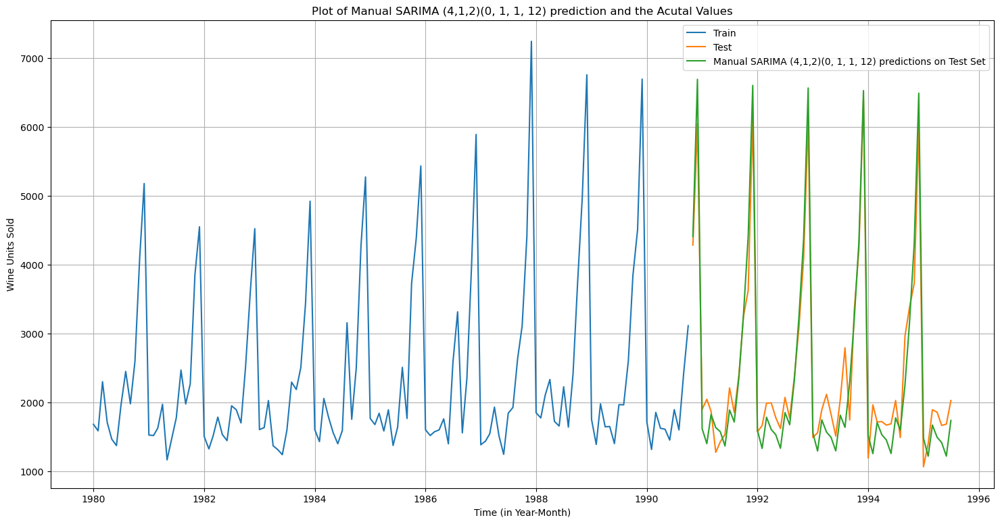

In [169]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Manual SARIMA (4,1,2)(0, 1, 1, 12) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [170]:
rmse = mean_squared_error(test['Sparkling'],predicted_manual_SARIMA.predicted_mean,squared=False)
mape = mean_absolute_percentage_error(test['Sparkling'],predicted_manual_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 373.57078182254025 
MAPE: 13.851089856067473


In [171]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Manual SARIMA (4, 1, 2)(0, 1, 1, 12)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (4,1,4)",1213.419549,35.179363
"Manual ARIMA (2,1,1)",1359.649838,37.619248
"Auto SARIMA (3,1,2)(3,0,1,12)",835.469775,18.707779
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",373.570782,13.851090


## Performance of the models built

In [172]:
#Combining the tables which contained the exponential smoothing models and ARIMA/SARIMA into one
resultsDf_Final = pd.concat([resultsDf,resultsDf_2])

resultsDf_Final

,Test RMSE,MAPE
Linear Regression,1392.438305,NaN
SimpleAverageModel,1368.746717,NaN
2pointTrailingMovingAverage,811.178937,NaN
4pointTrailingMovingAverage,1184.213295,NaN
6pointTrailingMovingAverage,1337.200524,NaN
9pointTrailingMovingAverage,1422.653281,NaN
"Alpha =0.0375,SimpleExponentialSmoothing",1362.428949,NaN
"Alpha=0.641, Beta=0.0001, Double Exponential Smoothing",3173.262078,NaN
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",1359.261034,NaN
"Alpha=0.0757,Beta=0.0649,Gamma=0.376,Triple Exponential Smoothing",381.655272,NaN


In [173]:
resultsDf_Final.sort_values(by='MAPE',ascending=True)

,Test RMSE,MAPE
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",373.570782,13.851090
"Auto SARIMA (3,1,2)(3,0,1,12)",835.469775,18.707779
"Auto ARIMA (4,1,4)",1213.419549,35.179363
"Manual ARIMA (2,1,1)",1359.649838,37.619248
Linear Regression,1392.438305,NaN
SimpleAverageModel,1368.746717,NaN
2pointTrailingMovingAverage,811.178937,NaN
4pointTrailingMovingAverage,1184.213295,NaN
6pointTrailingMovingAverage,1337.200524,NaN
9pointTrailingMovingAverage,1422.653281,NaN


In [174]:
resultsDf_Final.sort_values(by='Test RMSE',ascending=True)

,Test RMSE,MAPE
"Alpha=0.20,Beta=0.35,Gamma=0.80,Triple Exponential Smoothing",326.867284,NaN
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",373.570782,13.851090
"Alpha=0.0757,Beta=0.0649,Gamma=0.376,Triple Exponential Smoothing",381.655272,NaN
2pointTrailingMovingAverage,811.178937,NaN
"Auto SARIMA (3,1,2)(3,0,1,12)",835.469775,18.707779
4pointTrailingMovingAverage,1184.213295,NaN
"Auto ARIMA (4,1,4)",1213.419549,35.179363
6pointTrailingMovingAverage,1337.200524,NaN
"Alpha=0.05, Beta=0.05, Double Exponential Smoothing",1359.261034,NaN
"Manual ARIMA (2,1,1)",1359.649838,37.619248


### Compare the performance of the models

From the above results we can see that Triple exponential model is the optimum model followed by Trailing moving average models. However lets take TES and Manual SARIMA and predict for the future.

Text(0, 0.5, 'Wine Units Sold')

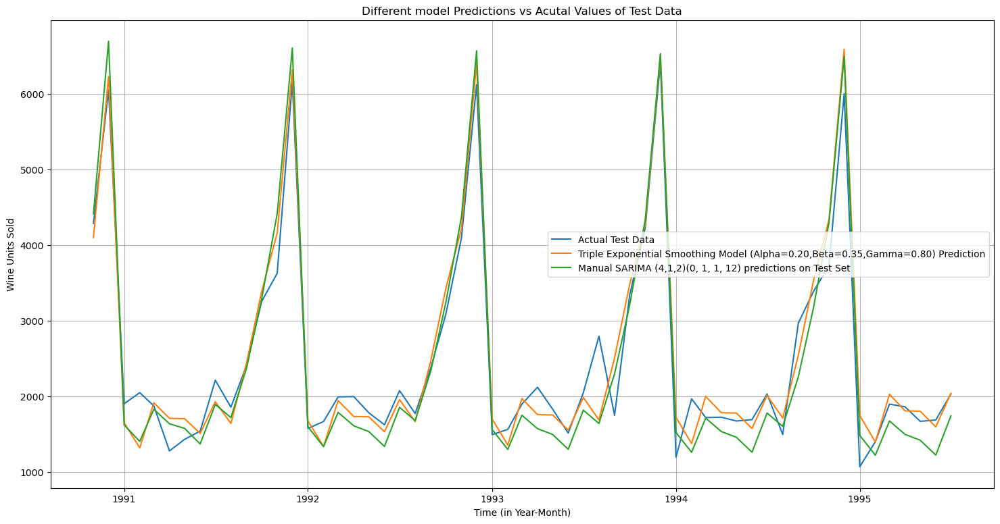

In [175]:
plt.figure(figsize=(18,9))
plt.plot(test['Sparkling'], label='Actual Test Data')

plt.plot(TES_test['predict', 0.2,0.35,0.80], label='Triple Exponential Smoothing Model (Alpha=0.20,Beta=0.35,Gamma=0.80) Prediction')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Different model Predictions vs Acutal Values of Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

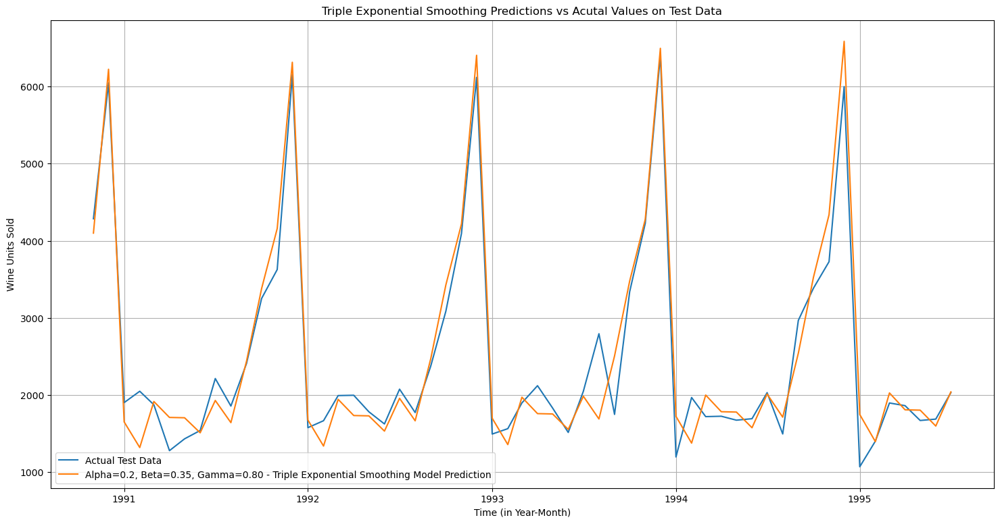

In [176]:
plt.figure(figsize=(18,9))
plt.plot(test['Sparkling'], label='Actual Test Data')

plt.plot(TES_test['predict', 0.2,0.35,0.80], label='Alpha=0.2, Beta=0.35, Gamma=0.80 - Triple Exponential Smoothing Model Prediction')

plt.legend(loc='best')
plt.grid();
plt.title('Triple Exponential Smoothing Predictions vs Acutal Values on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

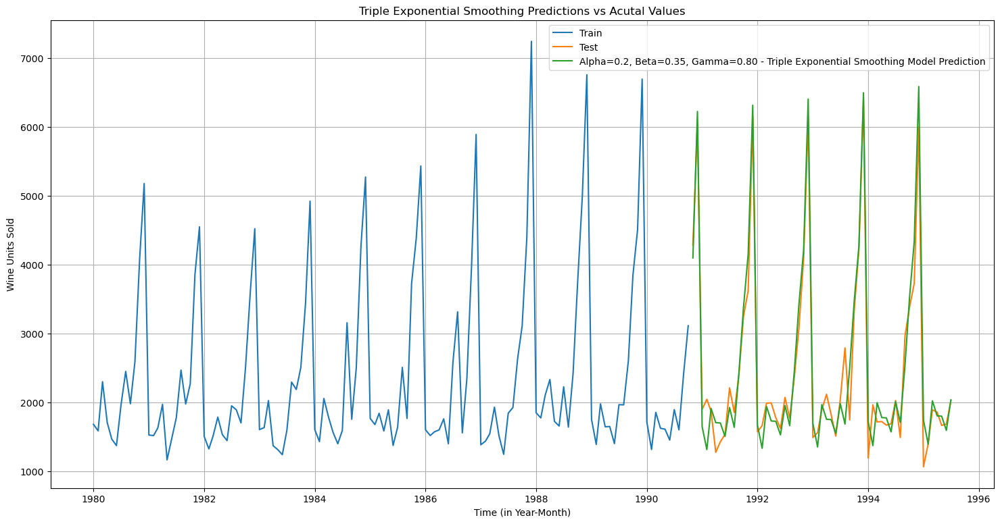

In [177]:
plt.figure(figsize=(18,9))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')

plt.plot(TES_test['predict', 0.2,0.35,0.80], label='Alpha=0.2, Beta=0.35, Gamma=0.80 - Triple Exponential Smoothing Model Prediction')

plt.legend(loc='best')
plt.grid();
plt.title('Triple Exponential Smoothing Predictions vs Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [178]:
TES_Fullmodel = ExponentialSmoothing(df['Sparkling'],trend='multiplicative',seasonal='multiplicative').fit(smoothing_level=0.2, smoothing_trend=0.35, smoothing_seasonal=0.80)

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [179]:
TES_Fullmodel.params

{'smoothing_level': 0.2,
 'smoothing_trend': 0.35,
 'smoothing_seasonal': 0.8,
 'damping_trend': nan,
 'initial_level': 2356.541555217826,
 'initial_trend': 1.023281277324765,
 'initial_seasons': array([0.83938367, 0.77551499, 1.15133577, 0.84780167, 0.73974795,
        0.72610798, 0.94686612, 1.16814998, 0.90319168, 1.2077656 ,
        1.98439706, 2.51685749]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [180]:
RMSE_fullmodel = metrics.mean_squared_error(df['Sparkling'],TES_Fullmodel.fittedvalues,squared=False)

print('RMSE:',RMSE_fullmodel)

RMSE: 491.5883317509548


In [181]:
prediction = TES_Fullmodel.forecast(steps=12)
print('Forecast of next 12 months')
prediction.tail(12)

Forecast of next 12 months


1995-08-01    1870.288172
1995-09-01    3277.197950
1995-10-01    2960.054554
1995-11-01    3016.837313
1995-12-01    4497.760817
1996-01-01     773.278295
1996-02-01    1031.211281
1996-03-01    1299.619470
1996-04-01    1249.022045
1996-05-01    1132.057617
1996-06-01    1157.777524
1996-07-01    1604.041540
Freq: MS, dtype: float64

Text(0, 0.5, 'Wine Units Sold')

<Figure size 1800x900 with 0 Axes>

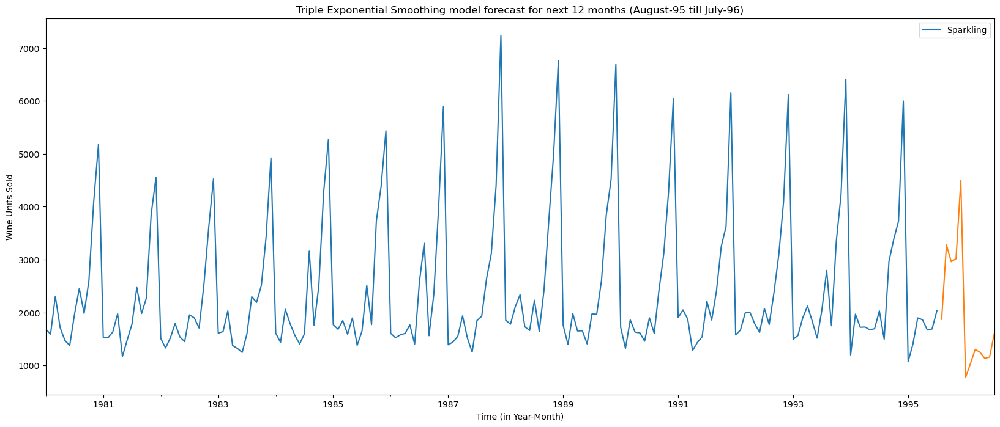

In [182]:
plt.figure(figsize=(18,9))
df.plot()
prediction.plot();
plt.title('Triple Exponential Smoothing model forecast for next 12 months (August-95 till July-96)')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [183]:
predicted_df = pd.DataFrame({'lower_ci':prediction - (1.96*np.std(TES_Fullmodel.resid,ddof=1)),
                          'prediction':prediction,
                          'upper_ci': prediction + (1.96*np.std(TES_Fullmodel.resid,ddof=1))})
predicted_df.head(12)

,lower_ci,prediction,upper_ci
1995-08-01,915.899200,1870.288172,2824.677144
1995-09-01,2322.808978,3277.197950,4231.586922
1995-10-01,2005.665582,2960.054554,3914.443526
1995-11-01,2062.448341,3016.837313,3971.226285
1995-12-01,3543.371844,4497.760817,5452.149789
1996-01-01,-181.110677,773.278295,1727.667267
1996-02-01,76.822309,1031.211281,1985.600253
1996-03-01,345.230498,1299.619470,2254.008443
1996-04-01,294.633073,1249.022045,2203.411018
1996-05-01,177.668645,1132.057617,2086.446589


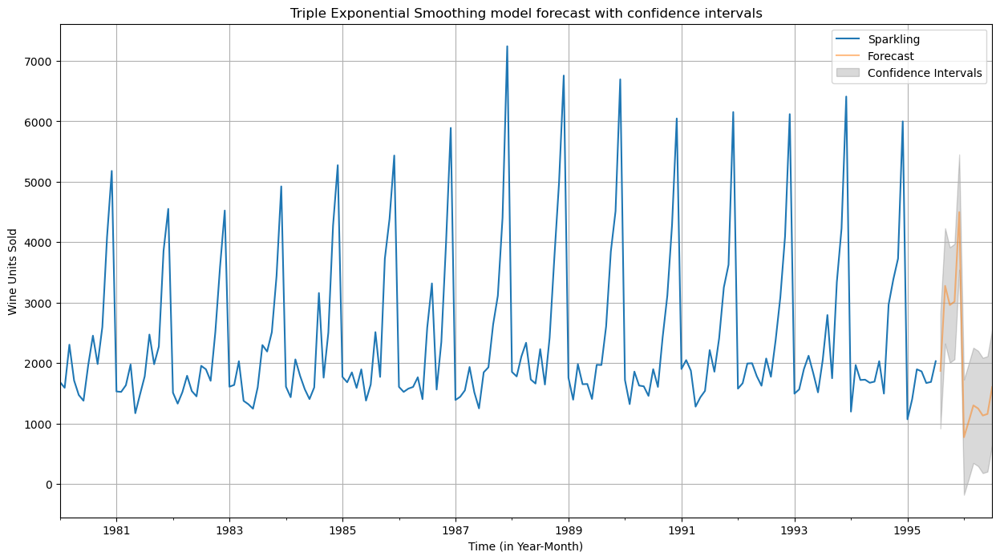

In [184]:
axis = df.plot(label='Actual', figsize=(15,8))
predicted_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='k', alpha=.15,label='Confidence Intervals')
plt.title('Triple Exponential Smoothing model forecast with confidence intervals')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

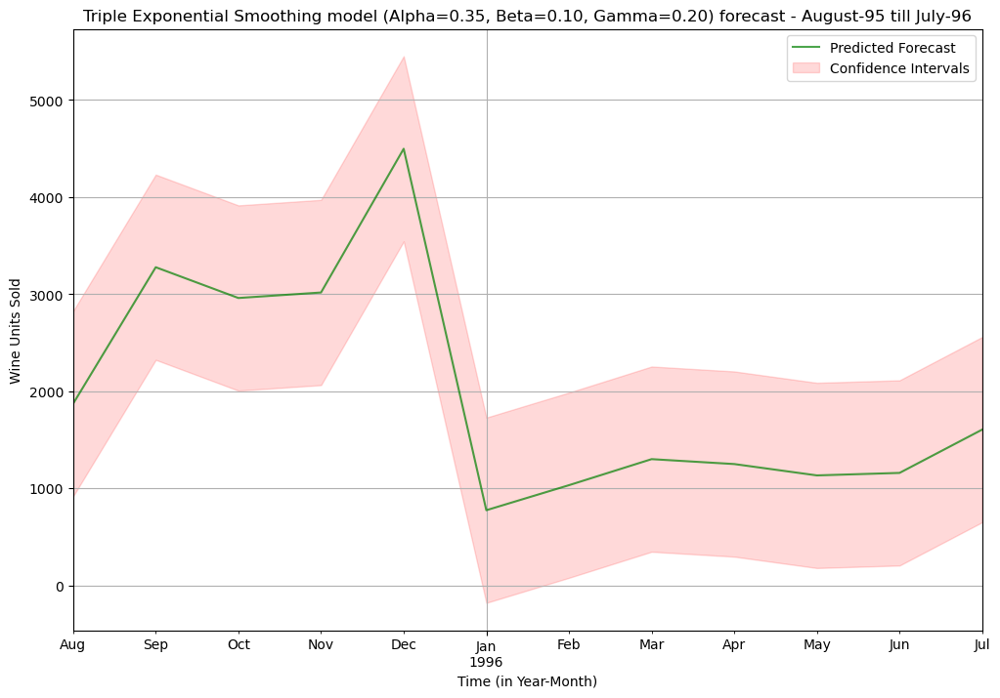

In [185]:
plt.figure(figsize=(12,8))
axis = prediction.plot(color='Green', label='Predicted Forecast', alpha=0.7)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='Red', alpha=.15, label='Confidence Intervals')
axis.set_title('Triple Exponential Smoothing model (Alpha=0.35, Beta=0.10, Gamma=0.20) forecast - August-95 till July-96')
axis.set_xlabel('Time (in Year-Month)')
axis.set_ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

## Optimum Model - Manual SARIMA Model (4, 1, 2)(0, 1, 1, 12) 

Text(0, 0.5, 'Wine Units Sold')

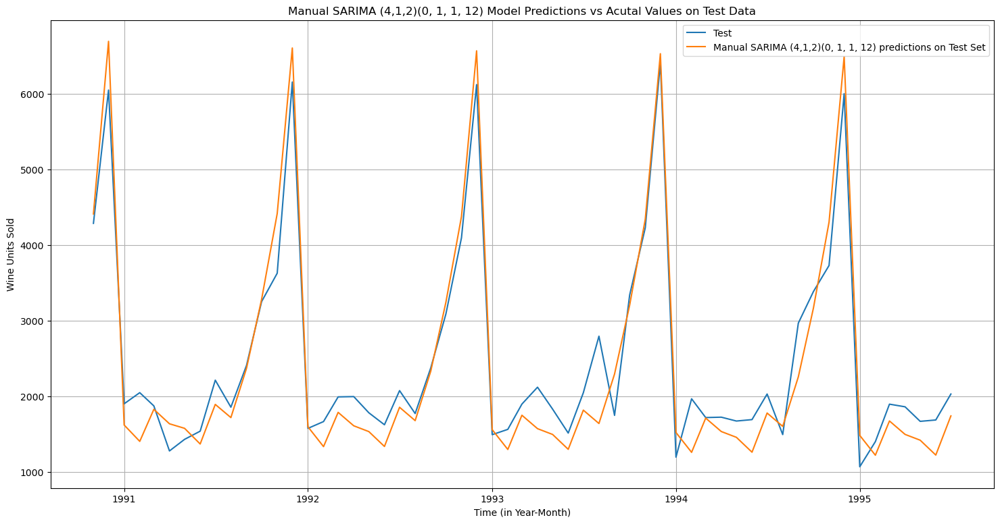

In [186]:
plt.figure(figsize=(18,9))
plt.plot(test['Sparkling'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) Model Predictions vs Acutal Values on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

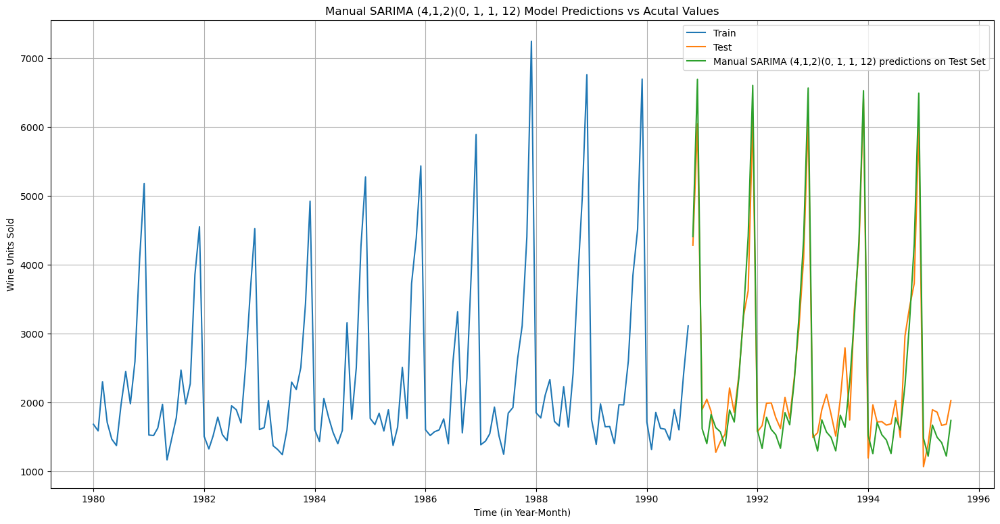

In [187]:
plt.figure(figsize=(18,9))
plt.plot(train['Sparkling'], label='Train')
plt.plot(test['Sparkling'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) Model Predictions vs Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [188]:
Manual_Sarima_FullModel = sm.tsa.statespace.SARIMAX(df['Sparkling'],
                                order= (4, 1, 2), 
                                seasonal_order= (0, 1, 1, 12), 
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_fullmodel_manual_sarima = Manual_Sarima_FullModel.fit(maxiter=1000)
print(results_fullmodel_manual_sarima.summary())

C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\ANACONDA\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


                                      SARIMAX Results                                       
Dep. Variable:                            Sparkling   No. Observations:                  187
Model:             SARIMAX(4, 1, 2)x(0, 1, [1], 12)   Log Likelihood               -1171.945
Date:                              Sun, 17 Nov 2024   AIC                           2359.889
Time:                                      20:29:08   BIC                           2384.441
Sample:                                  01-01-1980   HQIC                          2369.859
                                       - 07-01-1995                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6275      0.517      1.213      0.225      -0.386       1.641
ar.L2         -0.15

In [189]:
predicted_manual_sarima_full_data = results_fullmodel_manual_sarima.get_forecast(steps=12)
predicted_manual_sarima_full_data.summary_frame(alpha=0.05).head()

Sparkling,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-01,1850.816043,381.838124,1102.427071,2599.205015
1995-09-01,2396.196530,387.330649,1637.042408,3155.350651
1995-10-01,3227.083780,387.331765,2467.927470,3986.240090
1995-11-01,3898.042185,389.053953,3135.510448,4660.573921
1995-12-01,6099.973071,389.124066,5337.303916,6862.642227


In [190]:
predicted_manual_sarima_df = predicted_manual_sarima_full_data.summary_frame(alpha=0.05)
predicted_manual_sarima_df

Sparkling,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-01,1850.816043,381.838124,1102.427071,2599.205015
1995-09-01,2396.196530,387.330649,1637.042408,3155.350651
1995-10-01,3227.083780,387.331765,2467.927470,3986.240090
1995-11-01,3898.042185,389.053953,3135.510448,4660.573921
1995-12-01,6099.973071,389.124066,5337.303916,6862.642227
1996-01-01,1231.641865,389.124068,468.972706,1994.311023
1996-02-01,1559.208890,389.811419,795.192547,2323.225233
1996-03-01,1801.347911,390.840928,1035.313768,2567.382054
1996-04-01,1780.038156,392.386241,1010.975255,2549.101056
1996-05-01,1627.831124,394.277186,855.062040,2400.600208


In [191]:
rmse_manual_sarima_full = metrics.mean_squared_error(df['Sparkling'],results_fullmodel_manual_sarima.fittedvalues,squared=False)

rmse_manual_sarima_full

577.5088206078963

In [192]:
# Getting the predictions for the 12 months into the future
prediction_manual_sarima_full = results_fullmodel_manual_sarima.forecast(steps=12)
prediction_manual_sarima_full.tail(12)

1995-08-01    1850.816043
1995-09-01    2396.196530
1995-10-01    3227.083780
1995-11-01    3898.042185
1995-12-01    6099.973071
1996-01-01    1231.641865
1996-02-01    1559.208890
1996-03-01    1801.347911
1996-04-01    1780.038156
1996-05-01    1627.831124
1996-06-01    1570.336016
1996-07-01    1979.251232
Freq: MS, Name: predicted_mean, dtype: float64

Text(0, 0.5, 'Wine Units Sold')

<Figure size 1800x900 with 0 Axes>

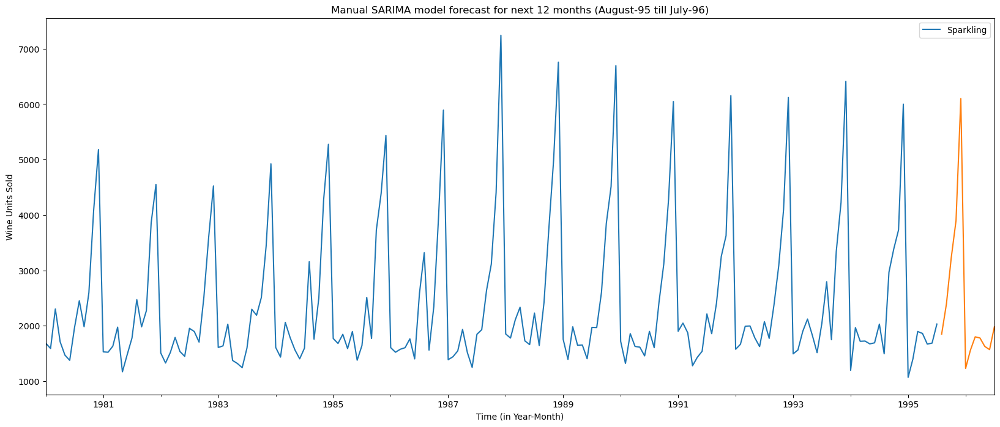

In [193]:
plt.figure(figsize=(18,9))
df.plot()
prediction_manual_sarima_full.plot();
plt.title('Manual SARIMA model forecast for next 12 months (August-95 till July-96)')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

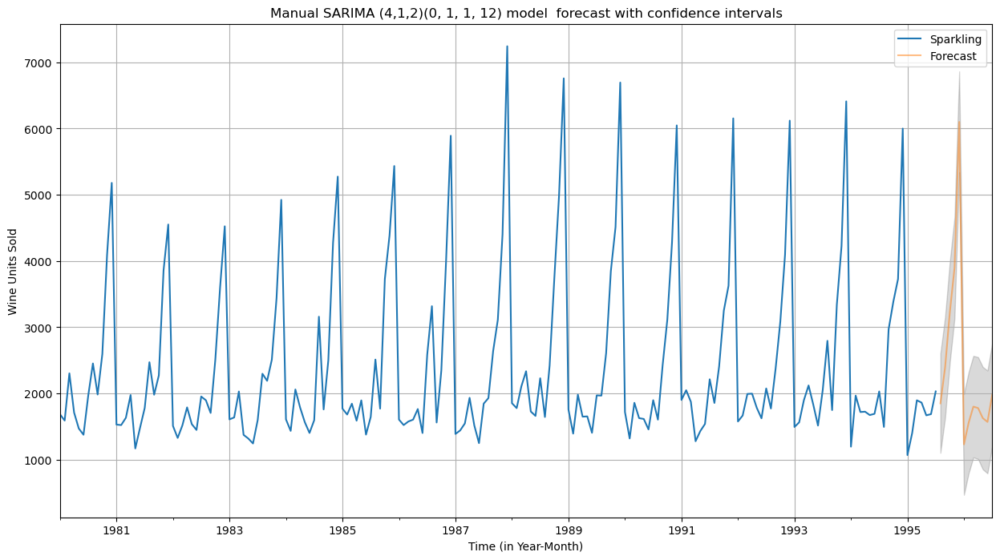

In [194]:
axis = df.plot(label='Actual', figsize=(15,8))
predicted_manual_sarima_df['mean'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(predicted_manual_sarima_df.index, predicted_manual_sarima_df['mean_ci_lower'], predicted_manual_sarima_df['mean_ci_upper'], color='k', alpha=.15)
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) model  forecast with confidence intervals')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

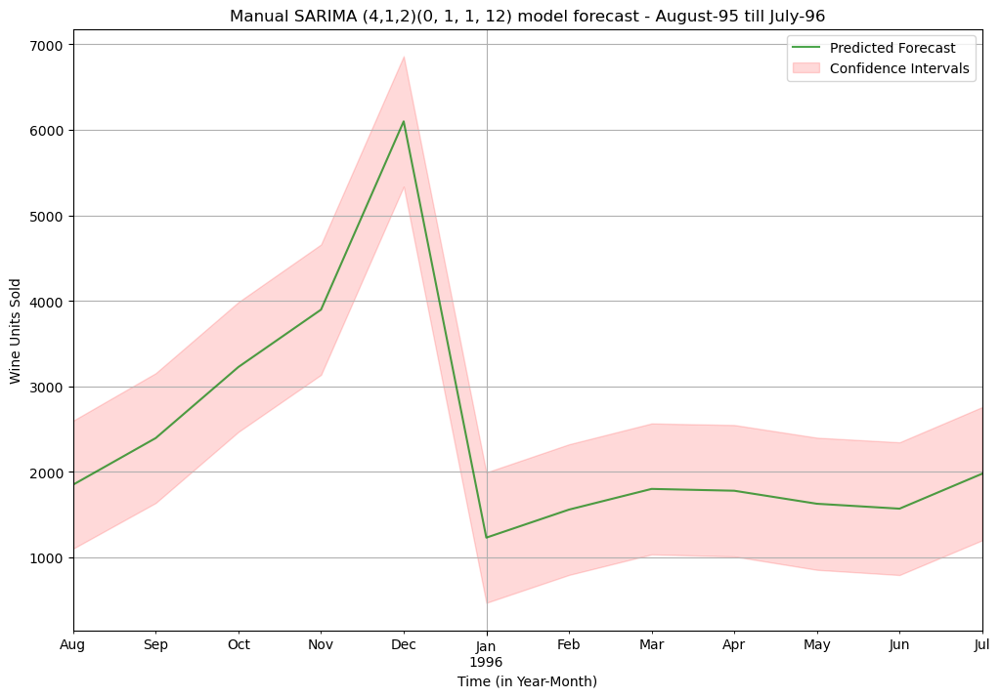

In [195]:
plt.figure(figsize=(12,8))
axis = predicted_manual_sarima_df['mean'].plot(color='Green', label='Predicted Forecast', alpha=0.7)
axis.fill_between(predicted_manual_sarima_df.index, predicted_manual_sarima_df['mean_ci_lower'], predicted_manual_sarima_df['mean_ci_upper'], color='Red', alpha=.15, label='Confidence Intervals')
axis.set_title('Manual SARIMA (4,1,2)(0, 1, 1, 12) model forecast - August-95 till July-96')
axis.set_xlabel('Time (in Year-Month)')
axis.set_ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

In [196]:
TES_Fullmodel.forecast(steps=12)

1995-08-01    1870.288172
1995-09-01    3277.197950
1995-10-01    2960.054554
1995-11-01    3016.837313
1995-12-01    4497.760817
1996-01-01     773.278295
1996-02-01    1031.211281
1996-03-01    1299.619470
1996-04-01    1249.022045
1996-05-01    1132.057617
1996-06-01    1157.777524
1996-07-01    1604.041540
Freq: MS, dtype: float64

In [197]:
TES_Fullmodel.forecast(steps=12).describe()

count      12.000000
mean     1989.095548
std      1166.129929
min       773.278295
25%      1151.347547
50%      1451.830505
75%      2974.250244
max      4497.760817
dtype: float64